# 一気通貫実装

In [1]:
DEFAULTS = {
    "svd_ratio": 0,                 # ← 可視化時はここを無視
    "non_iid_beta": 1,
}


In [2]:
import pandas as pd
import matplotlib.pyplot as plt


STYLE = {
    "nonlinear":               {"color": "#2ca02c", "linestyle": "-",  "marker": "o"},
    "nonlinear_zero":          {"color": "#2ca02c", "linestyle": "--", "marker": "o"},
    "laplacian_nonlinear":     {"color": "#1f77b4", "linestyle": "-",  "marker": "o"},
    "laplacian_nonlinear_zero":{"color": "#1f77b4", "linestyle": "--", "marker": "o"},
    "faster_gep":                     {"color": "#d62728", "linestyle": "-",  "marker": "o"},
    "imakura":                 {"color": "#d62728", "linestyle": ":",  "marker": "o"},
    "odc":                     {"color": "#d62728", "linestyle": "--", "marker": "o"},
    "targetvec_new":               {"color": "#d62728", "linestyle": "-.", "marker": "o"},
    "individual":              {"color": "gray",    "linestyle": "-",  "marker": None},
    "centralize":              {"color": "gray",    "linestyle": ":",  "marker": None},
    "federated_learning":                      {"color": "gray",    "linestyle": "--", "marker": "o"},
}


def visualize_with_defaults(
    csv_path,
    *,
    x_col,                     # 例: "svd_ratio"
    y_col="score_mean",
    xscale="linear",            # "linear" or "log"
    xlabel=None,
    title=None,
    defaults=DEFAULTS,
):
    """
    CSV を読み込み、
    - x_col 以外は DEFAULTS と一致する行のみ抽出
    - x_col vs y_col を可視化
    """

    # ------------------
    # Load
    # ------------------
    df = pd.read_csv(csv_path)

    # 数値化
    # for col in df.columns:
    #     try:
    #         df[col] = pd.to_numeric(df[col])
    #     except (ValueError, TypeError):
    #         # 数値に変換できない列はそのまま
    #         pass
    # ------------------
    # DEFAULTS フィルタ
    # ------------------
    for key, val in defaults.items():
        if key == x_col:
            continue              # ← 可視化軸は自由に動かす
        if key not in df.columns:
            continue
        if val is None:
            continue              # None は条件に使わない
        
        df = df[df[key] == val]
    # ------------------
    # zerosum → G_type 整理
    # ------------------
    if "zerosum" in df.columns:
        df.loc[
            (df["G_type"] == "nonlinear") & (df["zerosum"] == True),
            "G_type"
        ] = "nonlinear_zero"

        df.loc[
            (df["G_type"] == "laplacian_nonlinear") & (df["zerosum"] == True),
            "G_type"
        ] = "laplacian_nonlinear_zero"

    # ------------------
    # Plot
    # ------------------
    plt.figure(figsize=(9, 6))

    for g, gdf in df.groupby("G_type"):
        if g not in STYLE:
            continue
        gdf = gdf.dropna(subset=[x_col, y_col]).sort_values(x_col)
        st = STYLE[g]
        plt.plot(
            gdf[x_col],
            gdf[y_col],
            color=st["color"],
            linestyle=st["linestyle"],
            marker=st["marker"],
            label=g,
        )


    plt.xscale(xscale)
    plt.xlabel(xlabel if xlabel else x_col)
    plt.ylabel(y_col)

    if title:
        plt.title(title)

    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()


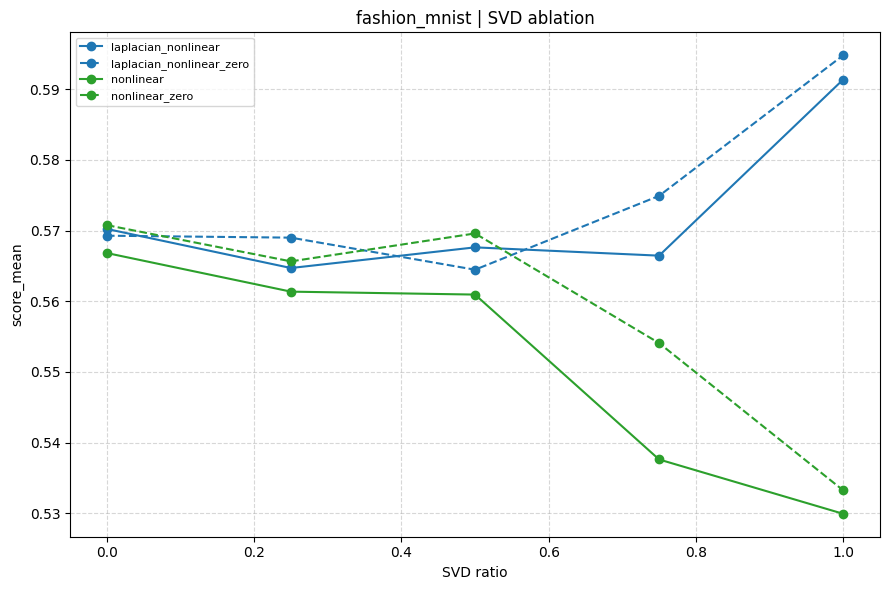

In [3]:
visualize_with_defaults(
    r"/Users/suetake/git-repos/takano_labo/dca/output/1218_bias_10/result_grid_fashion_mnist.csv",
    x_col="svd_ratio",
    xlabel="SVD ratio",
    title="fashion_mnist | SVD ablation"
)


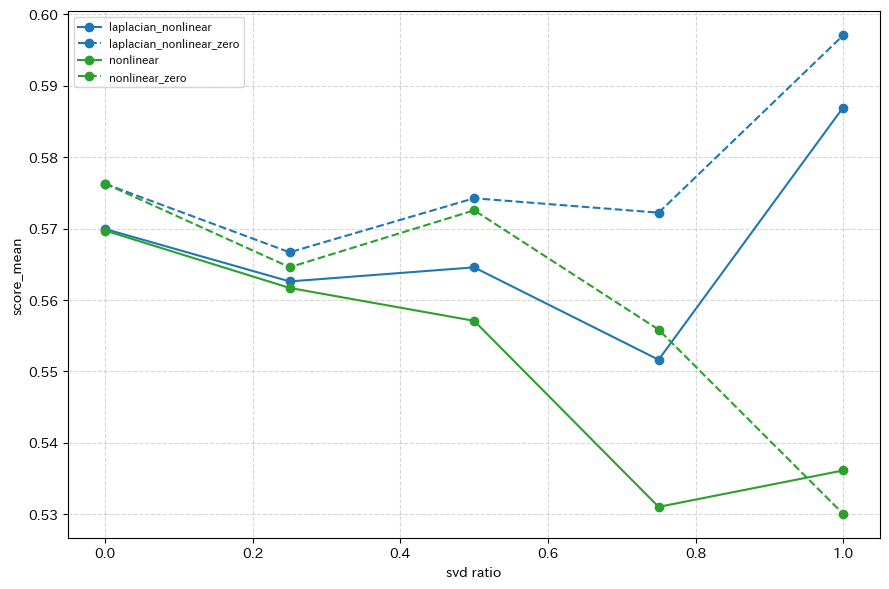

In [20]:
visualize_with_defaults(
    r"/Users/suetake/git-repos/takano_labo/dca/output/1218_bias/result_grid_fashion_mnist_svd_dir.csv",
    x_col="svd_ratio",
    xscale="linear",
    xlabel=r"svd ratio",
)


# これ

In [2]:
import pandas as pd

def load_and_filter(csv_path, *, x_col, defaults):
    df = pd.read_csv(csv_path)
    #df = pd.read_csv(csv_path, header=None)
    # ★ index が変なら必ずこれ ★
    #df = df.reset_index(drop=True)
    # 数値化（FutureWarning 回避）
    for col in df.columns:
        try:
            df[col] = pd.to_numeric(df[col])
        except (ValueError, TypeError):
            pass
    # ★ ここが重要 ★
    df["G_type"] = df["G_type"].astype(str)
    # DEFAULTS によるフィルタ（x_col 以外）
    for key, val in defaults.items():
        if key == x_col:
            continue
        if key not in df.columns or val is None:
            continue
        df = df[df[key] == val]

    if df.empty:
        raise ValueError("No data left after DEFAULTS filtering.")

    # zerosum → G_type 反映
    if "zerosum" in df.columns:
        df.loc[
            (df["G_type"] == "nonlinear") & (df["zerosum"] == True),
            "G_type"
        ] = "nonlinear_zero"
        df.loc[
            (df["G_type"] == "laplacian_nonlinear") & (df["zerosum"] == True),
            "G_type"
        ] = "laplacian_nonlinear_zero"

    return df




In [ ]:
import matplotlib.pyplot as plt

STYLE = {
    "gep":        {"color": "#d62728", "linestyle": "-",  "marker": "o"},
    "imakura":    {"color": "#d62728", "linestyle": ":",  "marker": "d"},
    "odc":        {"color": "#d62728", "linestyle": "--", "marker": "s"},
    "targetvec":  {"color": "#d62728", "linestyle": "-", "marker": "^"},

    "nonlinear":               {"color": "#2ca02c", "linestyle": "-",  "marker": "o"},
    "nonlinear_zero":          {"color": "#2ca02c", "linestyle": "--", "marker": "d"},
    "laplacian_nonlinear":     {"color": "#1f77b4", "linestyle": "-",  "marker": "o"},
    "laplacian_nonlinear_zero":{"color": "#1f77b4", "linestyle": "--", "marker": "d"},

    "individual":  {"color": "gray", "linestyle": "-",  "marker": None},
    "centralize":  {"color": "gray", "linestyle": ":",  "marker": None},
    #"fl":                      {"color": "gray",    "linestyle": "--", "marker": "o"},
}

def plot_filtered(
    df, *, x_col, y_col="score_mean",
    xscale="linear", xlabel=None, title=None
):
    plt.figure(figsize=(9, 6))

    for g, gdf in df.groupby("G_type"):
        if g not in STYLE:
            continue

        gdf = gdf.dropna(subset=[x_col, y_col]).sort_values(x_col)
        if gdf.empty:
            continue

        st = STYLE[g]
        plt.plot(
            gdf[x_col], gdf[y_col],
            color=st["color"],
            linestyle=st["linestyle"],
            marker=st["marker"],
            label=g
        )

    plt.xscale(xscale)
    plt.xlabel(xlabel if xlabel else x_col)
    plt.ylabel(y_col)

    # legend があるときだけ表示
    handles, labels = plt.gca().get_legend_handles_labels()
    if handles:
        plt.legend(fontsize=8)

    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()
    plt.show()


In [4]:
STYLE = {
    "individual":  {"name": "個別解析", "color": "gray", "linestyle": ":",  "marker": None},
    "centralize":  {"name": "集中解析", "color": "gray", "linestyle": "-",  "marker": None},

    "imakura":    {"name": "最小摂動問題（λ=∞, kernel=linear）", "color": "#d62728", "linestyle": ":",  "marker": "d"},
    "targetvec":  {"name": "目標ベクトル最適化（λ=0, kernel=linear）", "color": "#d62728", "linestyle": "-.", "marker": "^"},
    "gep":        {"name": "一般化固有値解法", "color": "#d62728", "linestyle": "-",  "marker": "o"},
    "odc":        {"name": "直交プロクラステス", "color": "#d62728", "linestyle": "--", "marker": "s"},

    "nonlinear":               {"name": "提案手法（λ=1, kernel=rbf）", "color": "#2ca02c", "linestyle": "-",  "marker": "o"},
    "nonlinear_zero":          {"name": "平均ゼロ化 提案手法（λ=1, kernel=rbf）", "color": "#2ca02c", "linestyle": "--", "marker": "d"},
    "laplacian_nonlinear":     {"name": "幾何的正則化付き 提案手法（λ=1, kernel=rbf）", "color": "#1f77b4", "linestyle": "-",  "marker": "o"},
    "laplacian_nonlinear_zero":{"name": "平均ゼロ化 幾何的正則化付き 提案手法（λ=1, kernel=rbf）", "color": "#1f77b4", "linestyle": "--", "marker": "d"},

    #"fl":                      {"color": "gray",    "linestyle": "--", "marker": "o"},
}

X_AXIS_STYLE = {
    "non_iid_beta": {
        "xlabel": r"データ非同一分布度合いを制御するパラメータ $\beta$",
        "xscale": "log",
        "title": "非同一分布度合いの影響",
    },
    "svd_ratio": {
        "xlabel": r"PCA による次元削減を行う機関比率",
        "xscale": "linear",
        "title": "線形次元削減 比率の影響",
    },
    "smote_ratio": {
        "xlabel": r"アンカーデータにおける公開データの比率",
        "xscale": "linear",
        "title": "アンカーデータの公開データ比率の影響",
    },
    "sub_dr_ratio": {
        "xlabel": r"PCA による次元削減を行う機関比率",
        "xscale": "linear",
        "title": "線形次元削減 比率の影響",
    },
}
Y_AXIS_STYLE = {
    "score_mean": {
        "ylabel": "分類精度（平均）",
    },
}

In [5]:
import os
print(os.getcwd())
print(os.path.exists(r"/Users/suetake/git-repos/takano_labo/dca/output/1218_bias/result_grid_fashion_mnist_svd_dir.csv"))


/Users/suetake/git-repos/takano_labo/dca/実験用
True


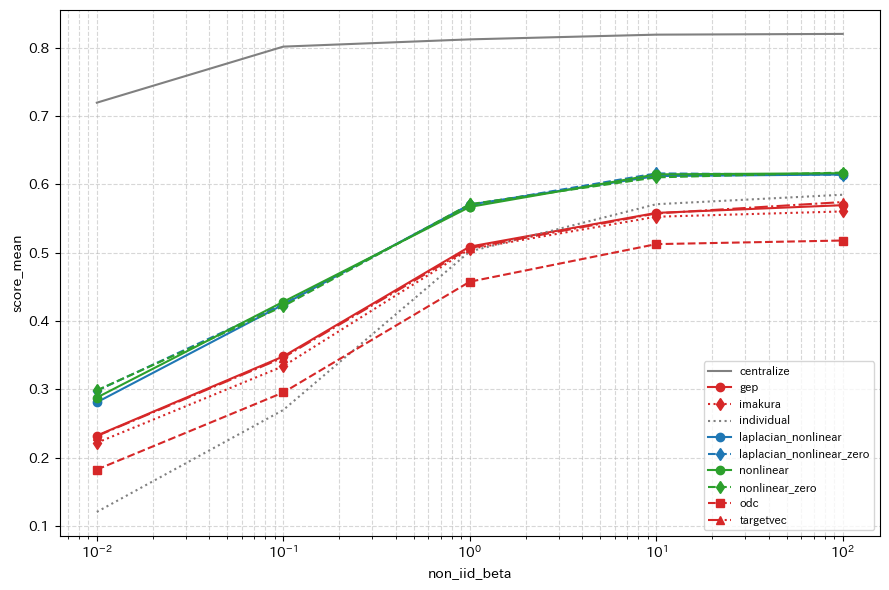

Index([  0,   1,   2,   3,   4,  25,  26,  27,  28,  29,  50,  51,  52,  53,
        54,  75,  76,  77,  78,  79, 100, 101, 102, 103, 104, 125, 126, 127,
       128, 129, 130, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
       146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 175,
       176, 187, 188, 189, 190, 191, 192, 193, 194, 195, 200, 201, 202, 203,
       204],
      dtype='int64')


In [25]:
df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_fashion_mnist_dir_svd.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)
df
plot_filtered(
    df,
    x_col="non_iid_beta",
    xscale="log",
    xlabel=r"non_iid_beta",
)
print(df.index)

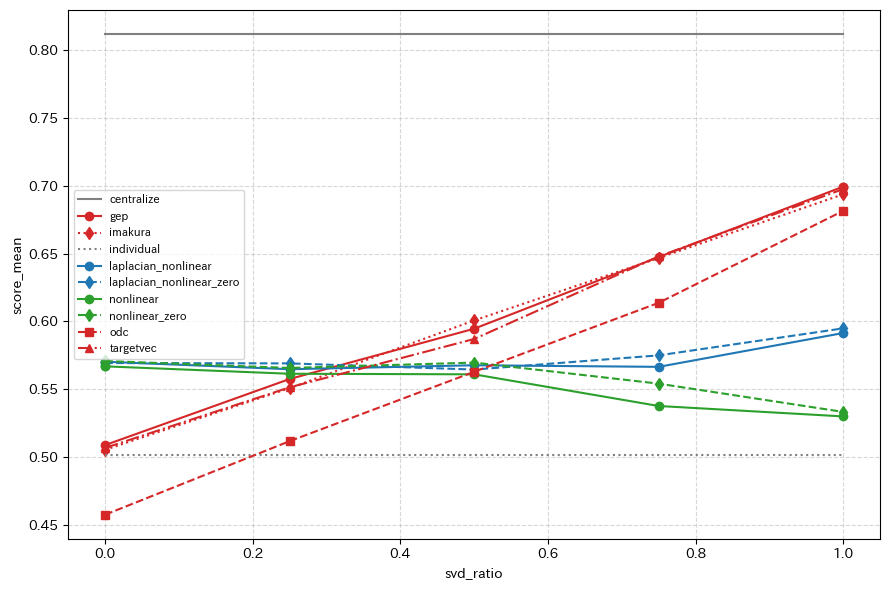

In [26]:
df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_fashion_mnist_dir_svd.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)
plot_filtered(
    df,
    x_col="svd_ratio",
    xscale="linear",
    xlabel=r"svd_ratio",
)

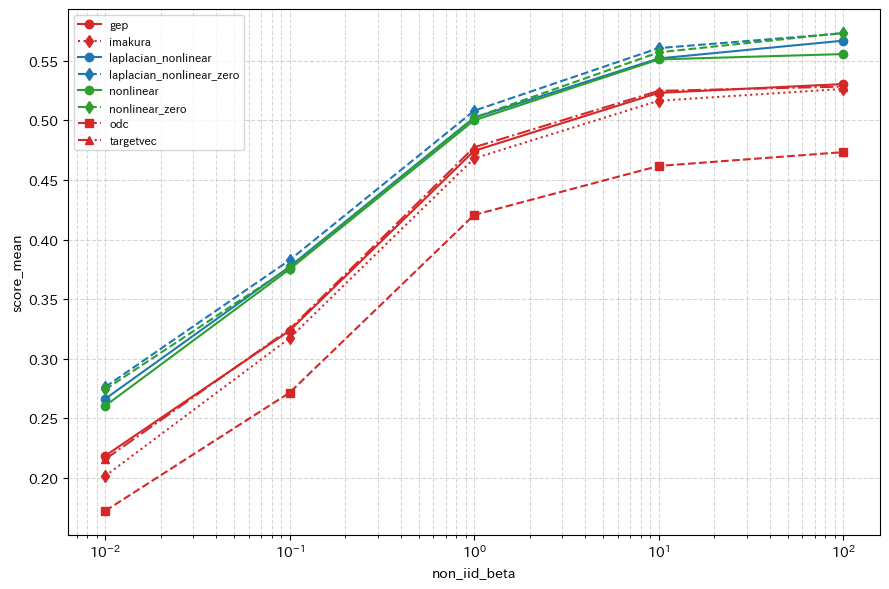

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71],
      dtype='int64')


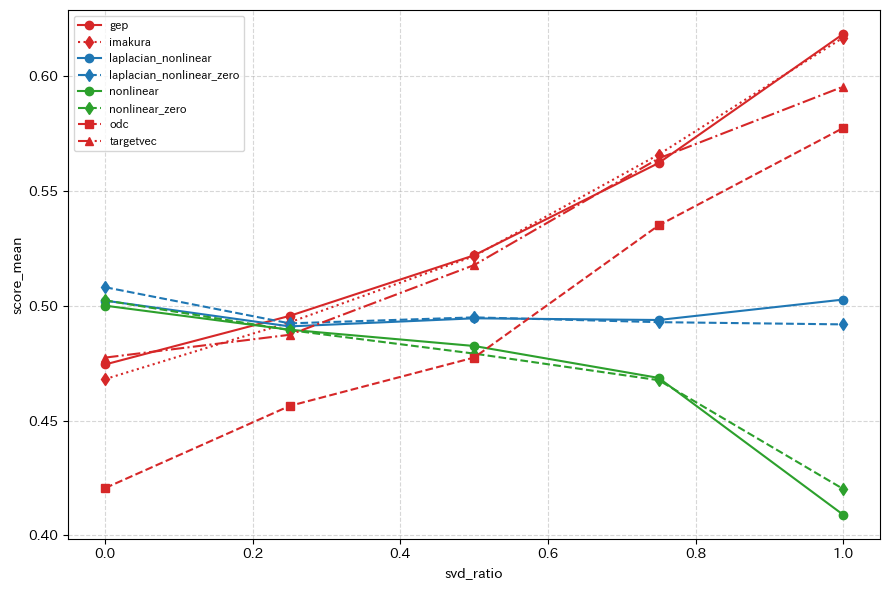

In [27]:
df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_mnist_dir_svd.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)
df
plot_filtered(
    df,
    x_col="non_iid_beta",
    xscale="log",
    xlabel=r"non_iid_beta",
)
print(df.index)

df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_mnist_dir_svd.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)
plot_filtered(
    df,
    x_col="svd_ratio",
    xscale="linear",
    xlabel=r"svd_ratio",
)

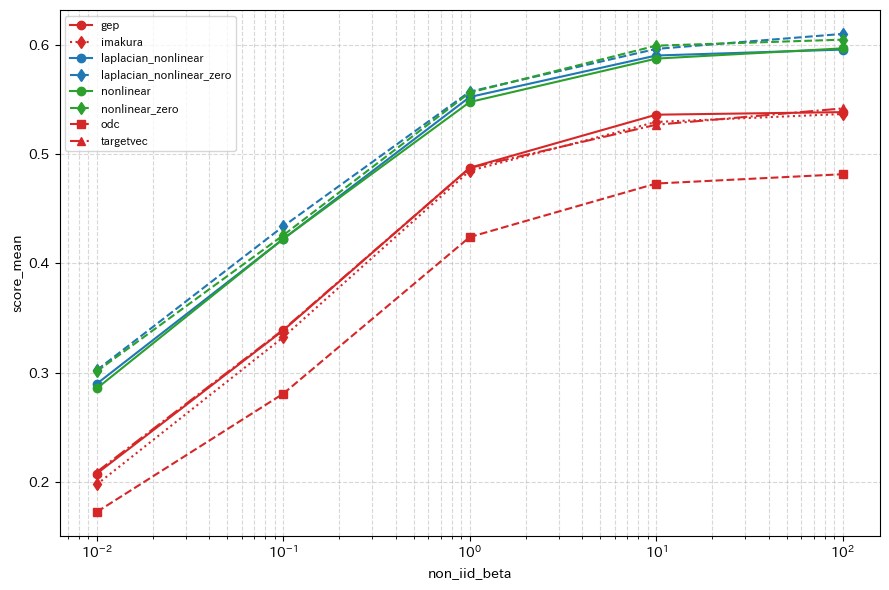

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71],
      dtype='int64')


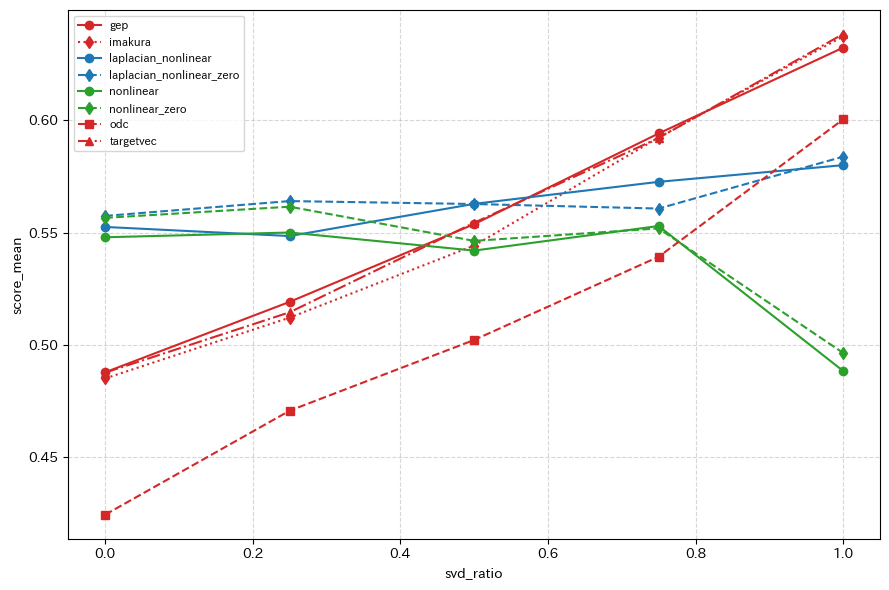

In [28]:
df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_mnist_dir_svd_public_1000.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)
df
plot_filtered(
    df,
    x_col="non_iid_beta",
    xscale="log",
    xlabel=r"non_iid_beta",
)
print(df.index)

df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_mnist_dir_svd_public_1000.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)
plot_filtered(
    df,
    x_col="svd_ratio",
    xscale="linear",
    xlabel=r"svd_ratio",
)

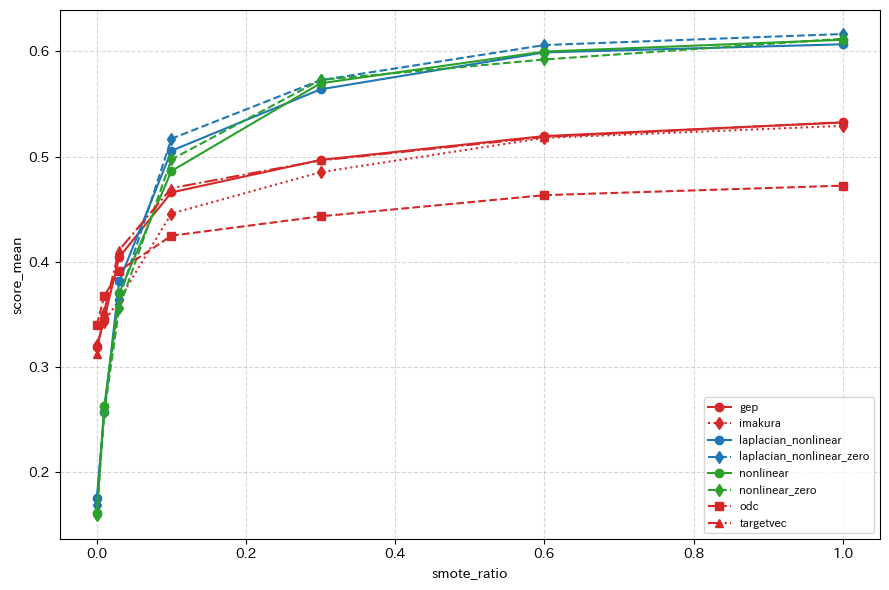

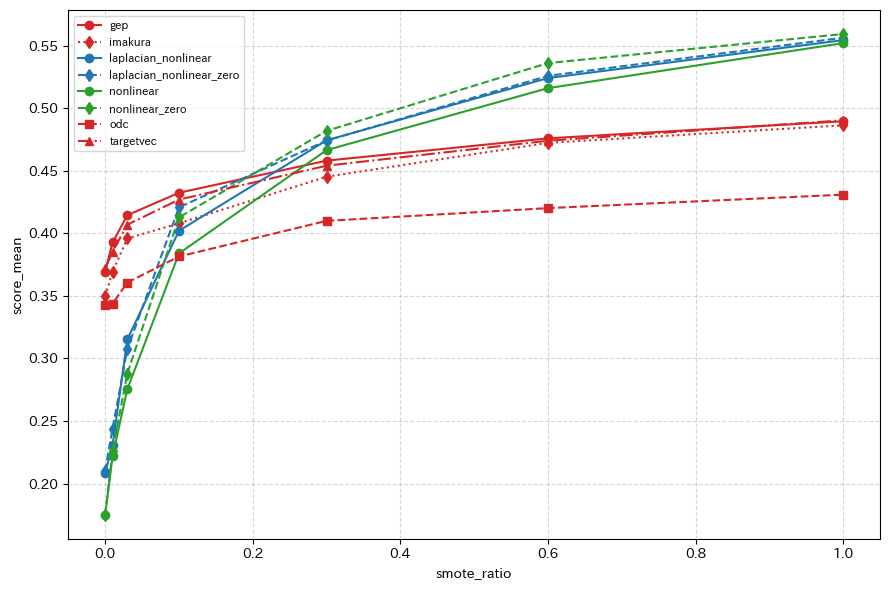

In [29]:
df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_fashion_mnist_anchor_concordance.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

plot_filtered(
    df,
    x_col="smote_ratio",
    xscale="linear",
    xlabel=r"smote_ratio",
)

df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_mnist_anchor_concordance.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

plot_filtered(
    df,
    x_col="smote_ratio",
    xscale="linear",
    xlabel=r"smote_ratio",
)

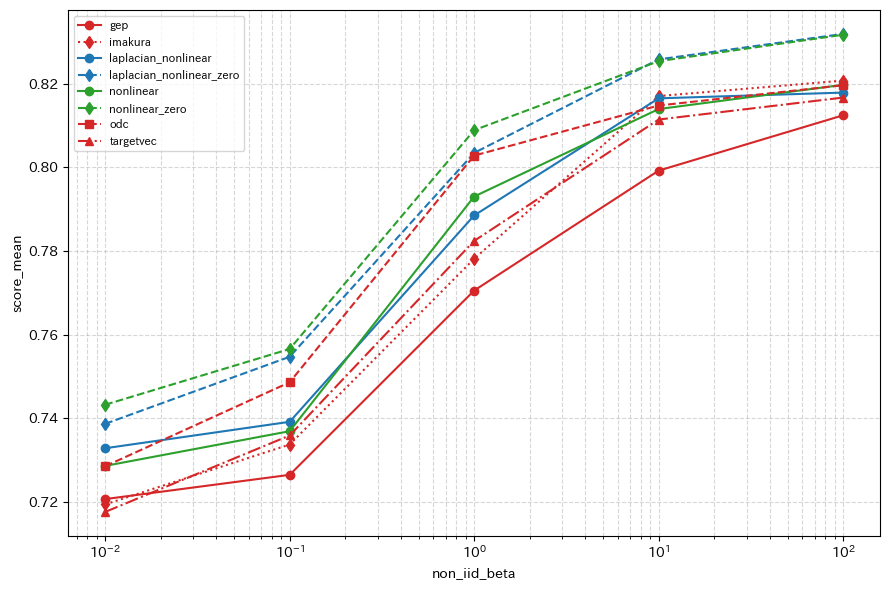

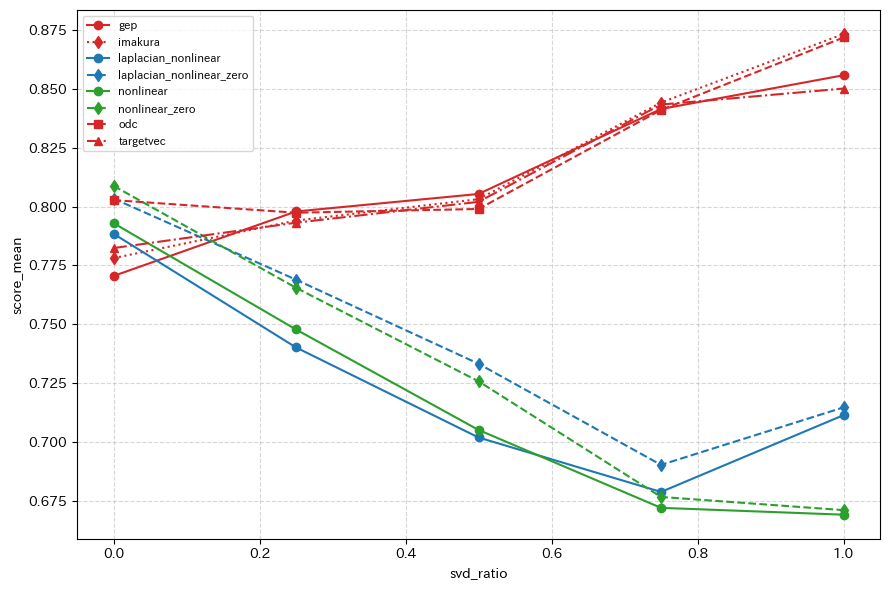

In [55]:
df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/122_mnist_breastcancer_2/result_grid_breast_cancer.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

plot_filtered(
    df,
    x_col="non_iid_beta",
    xscale="log",
    xlabel=r"non_iid_beta",
)

df = load_and_filter(
    r"/Users/suetake/git-repos/takano_labo/dca/output/122_mnist_breastcancer_2/result_grid_breast_cancer.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

plot_filtered(
    df,
    x_col="svd_ratio",
    xscale="linear",
    xlabel=r"svd_ratio",
)

# 卒論用

In [4]:
DEFAULTS = {
    #"svd_ratio": 0,                 # ← 可視化時はここを無視
    "non_iid_beta": 1,
    "sub_dr_ratio": 0,
    "num_institution": 10,
    "dim_intermediate": 10,
    "smote_ratio": 1.0,
    "public_anchor_num": 100,
}


In [5]:
["individual", "centralize", "nonlinear", "laplacian_nonlinear", "odc", "imakura", "gep_singular", "targetvec_singular"]

['individual',
 'centralize',
 'nonlinear',
 'laplacian_nonlinear',
 'odc',
 'imakura',
 'gep_singular',
 'targetvec_singular']

In [27]:
STYLE = {
    "centralize":  {"name": "集中解析", "color": "gray", "linestyle": "-",  "marker": None},
#（λ→infinity, kernel=linear） （λ=0, kernel=linear）
# "#9467bd"
    "laplacian_nonlinear_zero":{"name": "（提案）幾何的正則化＋平均ゼロ化 ", "color": "#1f77b4", "linestyle": "--", "marker": "d"},
    "laplacian_nonlinear":     {"name": "（提案）幾何的正則化", "color": "#1f77b4", "linestyle": "-",  "marker": "o"},
    "nonlinear_zero":          {"name": "（提案）平均ゼロ化", "color": "#2ca02c", "linestyle": "--", "marker": "d"},
    "nonlinear":               {"name": "（提案）非線形統合", "color": "#2ca02c", "linestyle": "-",  "marker": "o"},
    "laplacian_nonlinear_zero_tg": {
        "name": "（提案）ラベル考慮+平均ゼロ化",
        "color": "#c83f00",
        "linestyle": "--",
        "marker": "d",
    },
    "laplacian_nonlinear_tg": {
        "name": "（提案）ラベル考慮",
        "color": "#c83f00",
        "linestyle": "-",
        "marker": "o",
    },
    "targetvec_singular":  {"name": "目標行列最適化", "color": "#7030A0", "linestyle": "-", "marker": "o"},
    "gep_singular":        {"name": "一般化固有値解法", "color": "#7030A0", "linestyle": "--",  "marker": "d"},
    "imakura":    {"name": "最小摂動問題", "color": "#AE165E", "linestyle": "-",  "marker": "o"},
    "odc":        {"name": "直交プロクラステス", "color": "#AE165E", "linestyle": "--", "marker": "d"},
    "individual":  {"name": "個別解析", "color": "gray", "linestyle": ":",  "marker": None},
    #"fl":                      {"color": "gray",    "linestyle": "--", "marker": "o"},
}

X_AXIS_STYLE = {
    "non_iid_beta": {
        "xlabel": r"データ非同一分布度合いを制御するパラメータ $\beta$",
        "xscale": "log",
        "title": "非同一分布度合いの影響",
        "ticks": [0.01, 0.1, 1.0, 10.0, 100],
        "labels": ["0.01", "0.1", "1", "10", "100"],
        "G_type": [
            "individual",
            "nonlinear",
            "laplacian_nonlinear",
            "nonlinear_zero",
            "laplacian_nonlinear_zero",
            "imakura",
            "gep_singular",
            "targetvec_singular",
        ],
    },
    "sub_dr_ratio": {
        "xlabel": r"PCA による次元削減を行う機関数",
        "xscale": "linear",
        "title": "線形次元削減 比率の影響",
        "ticks": [0, 0.25, 0.5, 0.75, 1],
        "labels": ["0", "2", "5", "8", "10"],
        "G_type": [
            "individual",
            "nonlinear",
            "laplacian_nonlinear",
            "imakura",
            "gep_singular",
            "targetvec_singular",
            "nonlinear_zero",
            "laplacian_nonlinear_zero",
        ],
        "G_type_for_slide": [
            "nonlinear",
            "laplacian_nonlinear",
            "targetvec_singular",
        ],
    },
    "smote_ratio": {
        "xlabel": r"アンカーデータにおける実データ数",
        "xscale": "linear",
        "title": "アンカーデータの実データ数の影響",
        "ticks": [0, 0.03, 0.1, 0.3, 1],
        "labels": ["0", "30", "100", "300", "1000"],
        "G_type": [
            "odc",
            "nonlinear",
            "laplacian_nonlinear",
            "nonlinear_zero",
            "laplacian_nonlinear_zero",
            "imakura",
            "gep_singular",
            "targetvec_singular",
        ],
    },
    "public_anchor_num": {
        "xlabel": r"SMOTEの対象データ数",
        "xscale": "log",
        "title": "",
        "ticks": [10, 30, 100, 300, 1000],
        "labels": ["10", "30", "100", "300", "1000"],
        "G_type": [
            "odc",
            "nonlinear",
            "imakura",
            "gep_singular",
            "targetvec_singular",
            "individual",
        ],
    },
    "num_institution": {
        "xlabel": r"機関数",
        "xscale": "log",
        "title": "", #"参加機関数の影響",
        "ticks": [2, 4, 8, 16, 32, 64, 128], #
        "labels": ["2", "4", "8", "16", "32", "64", "128"],
        "G_type": [
            "individual",
            "nonlinear",
            "laplacian_nonlinear",
            "nonlinear_zero",
            "laplacian_nonlinear_zero",
            "laplacian_nonlinear_tg",
            "laplacian_nonlinear_zero_tg",
            "imakura",
            "gep_singular",
            "targetvec_singular",
            "odc"
        ],
        "G_type_for_slide": [
            "individual",
            "nonlinear",
            "laplacian_nonlinear",
            "nonlinear_zero",
            "laplacian_nonlinear_zero",
            "laplacian_nonlinear_tg",
            "laplacian_nonlinear_zero_tg",
            # "imakura",
            # "gep_singular",
            # "targetvec_singular",
            # "odc",
        #    "centralize"
        ],
    },

    "dim_intermediate": {
        "xlabel": r"中間表現の次元数",
        "xscale": "log",
        "title": "中間表現の次元数",
        "ticks": [2, 4, 8, 16, 32],
        "labels": ["2", "4", "8", "16", "32"],
        "G_type": [
            "individual",
            "nonlinear",
            "laplacian_nonlinear",
            "nonlinear_zero",
            "laplacian_nonlinear_zero",
            "imakura",
            "gep_singular",
            "targetvec_singular",
            "odc"
        ],
    },
}
Y_AXIS_STYLE = {
    "score_mean": {
        "ylabel": "分類精度（機関平均）",
    },
}
LEGEND_STYLE = {
    "non_iid_beta": "upper left",
    "smote_ratio": "lower right",
    "num_institution": "upper left",
    "sub_dr_ratio": "lower left",
    "dim_intermediate": "lower right",
    "public_anchor_num": "lower right",
}

In [28]:

# import os
# import pandas as pd
# import matplotlib.pyplot as plt
# import japanize_matplotlib
# import matplotlib.ticker as mticker

# def load_filter_and_plot(
#     *,
#     path,
#     csv_name,
#     dataset,
#     x_col,
#     defaults,
#     y_col="score_mean",
# ):
#     # =====================
#     # load
#     # =====================
#     csv_path = os.path.join(path, csv_name)
#     df = pd.read_csv(csv_path)

#     # 数値化（FutureWarning 回避）
#     for col in df.columns:
#         try:
#             df[col] = pd.to_numeric(df[col])
#         except (ValueError, TypeError):
#             pass

#     df["G_type"] = df["G_type"].astype(str)

#     # =====================
#     # DEFAULTS fillna
#     # =====================
#     for key, val in defaults.items():
#         if key in df.columns and val is not None:
#             df[key] = df[key].fillna(val)

#     # =====================
#     # DEFAULTS filtering
#     # =====================
#     for key, val in defaults.items():
#         if key == x_col:
#             continue
#         if key not in df.columns or val is None:
#             continue
#         df = df[df[key] == val]

#     if df.empty:
#         raise ValueError("No data left after DEFAULTS filtering.")


#     df.loc[
#         (df["G_type"] == "nonlinear_new"),
#         "G_type"
#     ] = "nonlinear"

#     df.loc[
#         (df["G_type"] == "laplacian_nonlinear_new"),
#         "G_type"
#     ] = "laplacian_nonlinear"

#     # =====================
#     # zerosum → G_type
#     # =====================
#     if "zerosum" in df.columns:
#         df.loc[
#             (df["G_type"] == "nonlinear") & (df["zerosum"] == True),
#             "G_type"
#         ] = "nonlinear_zero"

#         df.loc[
#             (df["G_type"] == "laplacian_nonlinear") & (df["zerosum"] == True),
#             "G_type"
#         ] = "laplacian_nonlinear_zero"

#     # =====================
#     # axis style
#     # =====================
#     x_style = X_AXIS_STYLE.get(x_col, {})
#     xlabel = x_style.get("xlabel", x_col)
#     xscale = x_style.get("xscale", "linear")
#     base_title = x_style.get("title", None)

#     y_style = Y_AXIS_STYLE.get(y_col, {})
#     ylabel = y_style.get("ylabel", y_col)

#     # dataset をタイトル先頭に
#     title = f"{dataset}：{base_title}" if base_title else dataset

#     # =====================
#     # plot
#     # =====================
#     plt.figure(figsize=(9, 6))

#     handles = []
#     labels = []

#     # STYLE の順番で描画
#     for g, st in STYLE.items():
#         if g not in df["G_type"].unique():
#             continue

#         gdf = (
#             df[df["G_type"] == g]
#             .dropna(subset=[x_col, y_col])
#             .sort_values(x_col)
#         )

#         if gdf.empty:
#             continue

#         line, = plt.plot(
#             gdf[x_col],
#             gdf[y_col],
#             color=st["color"],
#             linestyle=st["linestyle"],
#             marker=st["marker"],
#         )

#         handles.append(line)
#         labels.append(st["name"])

#     plt.xscale(xscale)

#     # 実データに存在する x の値（丸めてズレを消す）
#     x_values = (
#         df.dropna(subset=[x_col])
#         .sort_values(x_col)[x_col]
#         .astype(float)
#         .round(6)
#         .unique()
#     )

#     # log 軸では 0 以下を除外
#     if xscale == "log":
#         x_values = [x for x in x_values if x > 0]

#     ax = plt.gca()

#     # ここが重要：目盛り位置を固定
#     ax.xaxis.set_major_locator(mticker.FixedLocator(x_values))

#     # ここが重要：表示ラベルを固定（10^n 表記をやめる）
#     ax.xaxis.set_major_formatter(mticker.FixedFormatter([f"{x:g}" for x in x_values]))

#     # minor tick（細かい目盛り）が邪魔なら消す
#     ax.xaxis.set_minor_locator(mticker.NullLocator())
#     #plt.xticks(x_values)

#     plt.xlabel(xlabel)
#     plt.ylabel(ylabel)
#     plt.title(title)

#     if handles:
#         plt.legend(
#             handles,
#             labels,
#             loc=LEGEND_STYLE.get(x_col, "upper left"),   # ← 左上に固定
#             fontsize=8,
#         )

#     plt.grid(True, which="both", ls="--", alpha=0.5)
#     plt.tight_layout()
#     plt.show()


In [29]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import japanize_matplotlib
import matplotlib.ticker as mticker

def load_filter_and_plot(
    *,
    path,
    csv_name,
    dataset,
    x_col,
    defaults,
    y_col="score_mean",
    for_slide=False,
    only_ticks=True,
    y_ticks=None,          # ← 追加（例: [0.44, 0.56]）
):
    # =====================
    # load
    # =====================
    csv_path = os.path.join(path, csv_name)
    df = pd.read_csv(csv_path)

    # 数値化（FutureWarning 回避）
    for col in df.columns:
        try:
            df[col] = pd.to_numeric(df[col])
        except (ValueError, TypeError):
            pass

    if "G_type" not in df.columns:
        raise ValueError("CSV must contain 'G_type' column.")
    df["G_type"] = df["G_type"].astype(str)

    # =====================
    # DEFAULTS fillna
    # =====================
    for key, val in defaults.items():
        if key in df.columns and val is not None:
            df[key] = df[key].fillna(val)

    # =====================
    # DEFAULTS filtering
    # =====================
    for key, val in defaults.items():
        if key == x_col:
            continue
        if key not in df.columns or val is None:
            continue
        df = df[df[key] == val]

    if df.empty:
        raise ValueError("No data left after DEFAULTS filtering.")

    # =====================
    # G_type 名称統一
    # =====================
    df.loc[df["G_type"] == "nonlinear_new", "G_type"] = "nonlinear"
    df.loc[df["G_type"] == "laplacian_nonlinear_new", "G_type"] = "laplacian_nonlinear"

    # =====================
    # zerosum / regularization → G_type
    # =====================
    if "regularization" in df.columns:
        is_tg = df["regularization"] == "target-graph"
    else:
        is_tg = False


    # target-graph 正規化判定
    is_tg = (
        df["regularization"]
        .fillna("")
        .astype(str)
        .str.strip()
        .str.lower()
        .isin(["target-graph", "target_graph"])
    )


    if "zerosum" in df.columns:
        is_zero = df["zerosum"] == True
    else:
        is_zero = False

    # nonlinear
    df.loc[(df["G_type"] == "nonlinear") & is_zero, "G_type"] = "nonlinear_zero"
    #df.loc[(df["G_type"] == "nonlinear") & is_tg,   "G_type"] = "nonlinear_tg"
    #df.loc[(df["G_type"] == "nonlinear") & is_zero & is_tg, "G_type"] = "nonlinear_zero_tg"

    # laplacian_nonlinear
    # ベース
    df.loc[df["G_type"] == "laplacian_nonlinear_new", "G_type"] = "laplacian_nonlinear"

    # ① zero + tg（最優先）
    df.loc[
        (df["G_type"] == "laplacian_nonlinear") & is_zero & is_tg,
        "G_type"
    ] = "laplacian_nonlinear_zero_tg"

    # ② zero のみ
    df.loc[
        (df["G_type"] == "laplacian_nonlinear") & is_zero & ~is_tg,
        "G_type"
    ] = "laplacian_nonlinear_zero"

    # ③ tg のみ
    df.loc[
        (df["G_type"] == "laplacian_nonlinear") & ~is_zero & is_tg,
        "G_type"
    ] = "laplacian_nonlinear_tg"



    # =====================
    # axis style
    # =====================
    x_style = X_AXIS_STYLE.get(x_col, {})
    xlabel = x_style.get("xlabel", x_col)
    xscale = x_style.get("xscale", "linear")
    base_title = x_style.get("title", None)

    y_style = Y_AXIS_STYLE.get(y_col, {})
    ylabel = y_style.get("ylabel", y_col)

    ticks = x_style.get("ticks", None)
    tick_labels = x_style.get("labels", None)

    if only_ticks and ticks is None:
        raise ValueError(f"only_ticks=True but no ticks defined for x_col='{x_col}'")

    title = f"{dataset}：{base_title}" if base_title else dataset

    # =====================
    # style switch (paper / slide)
    # =====================
    if for_slide:
        FIGSIZE = (10, 7)
        FONT_SIZE = {"title": 25, "label": 25, "tick": 20, "legend": 20}
        LINE_WIDTH = 5.0
        MARKER_SIZE = 15
        GRID_ALPHA = 0.35
        line_alpha = 0.85
        lw = LINE_WIDTH * 0.8   # 線だけ少し細く
    else:
        FIGSIZE = (9, 6)
        FONT_SIZE = {"title": 12, "label": 11, "tick": 10, "legend": 11}
        LINE_WIDTH = 2.0
        MARKER_SIZE = 6
        GRID_ALPHA = 0.5
        line_alpha = 0.9
        lw = LINE_WIDTH

    # =====================
    # plot
    # =====================
    plt.figure(figsize=FIGSIZE)

    handles = []
    legend_labels = []

    # --- x_col ごとに描画する G_type を制限（設定があればそれだけ描く） ---
    if for_slide:
        allowed_gtypes = x_style.get("G_type_for_slide", None)
        # フォールバック：for_slide 用が無ければ通常用を使う
        if allowed_gtypes is None:
            allowed_gtypes = x_style.get("G_type", None)
    else:
        allowed_gtypes = x_style.get("G_type", None)

    if allowed_gtypes is not None:
        allowed_gtypes = set(allowed_gtypes)
    # ----------------------------------------------------------------------

    if allowed_gtypes is not None:
        allowed_gtypes = set(allowed_gtypes)

    # only_ticks 用の丸め済み ticks（毎回作らない）
    if only_ticks:
        ticks_rounded = [round(float(t), 6) for t in ticks]

    for g, st in STYLE.items():
        if allowed_gtypes is not None and g not in allowed_gtypes:
            continue
        if g not in df["G_type"].unique():
            continue

        gdf = (
            df[df["G_type"] == g]
            .dropna(subset=[x_col, y_col])
            .sort_values(x_col)
        )

        # ★ only_ticks: ticks に含まれる x だけ残す
        if only_ticks:
            gdf = gdf[gdf[x_col].astype(float).round(6).isin(ticks_rounded)]

        if gdf.empty:
            continue

        line, = plt.plot(
            gdf[x_col],
            gdf[y_col],
            color=st["color"],
            linestyle=st["linestyle"],
            marker=st["marker"],
            linewidth=lw,
            markersize=MARKER_SIZE,
            alpha=line_alpha,
            #markerfacecolor="none",
        )

        handles.append(line)
        legend_labels.append(st["name"])

    plt.xscale(xscale)
    ax = plt.gca()

    # =====================
    # ticks / labels 反映（優先）
    # =====================
    if ticks is not None:
        if xscale == "log":
            ticks = [t for t in ticks if t > 0]

        ax.xaxis.set_major_locator(mticker.FixedLocator(ticks))

        if tick_labels is None:
            tick_labels = [f"{t:g}" for t in ticks]

        ax.xaxis.set_major_formatter(mticker.FixedFormatter(tick_labels))
        ax.xaxis.set_minor_locator(mticker.NullLocator())
    else:
        x_values = (
            df.dropna(subset=[x_col])
            .sort_values(x_col)[x_col]
            .astype(float)
            .round(6)
            .unique()
        )
        if xscale == "log":
            x_values = [x for x in x_values if x > 0]

        ax.xaxis.set_major_locator(mticker.FixedLocator(x_values))
        ax.xaxis.set_major_formatter(mticker.FixedFormatter([f"{x:g}" for x in x_values]))
        ax.xaxis.set_minor_locator(mticker.NullLocator())

    # labels / title / ticks fontsize
    plt.xlabel(xlabel, fontsize=FONT_SIZE["label"])
    plt.ylabel(ylabel, fontsize=FONT_SIZE["label"])
    plt.title(title, fontsize=FONT_SIZE["title"])
    # =====================
    # y-axis control
    # =====================
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))
    ax.tick_params(axis="both", labelsize=FONT_SIZE["tick"])

    if y_ticks is not None:
        if len(y_ticks) != 2:
            raise ValueError("y_ticks must be [ymin, ymax]")

        ymin, ymax = y_ticks
        ax.set_ylim(ymin, ymax)

        # tick を自動で良い感じに置く（5本）
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5))


    # legend（for_slide は無し）
    if (not for_slide) and handles:
        plt.legend(
            handles,
            legend_labels,
            loc=LEGEND_STYLE.get(x_col, "upper left"),
            fontsize=FONT_SIZE["legend"],
            frameon=True,
        )
    else:
        # plt.legend(
        #     handles,
        #     legend_labels,
        #     loc="center left",
        #     bbox_to_anchor=(1.02, 0.5),
        #     fontsize=FONT_SIZE["legend"],
        #     frameon=False,
        # )
        # plt.tight_layout(rect=[0, 0, 0.8, 1])
        pass


    plt.grid(True, which="both", ls="--", alpha=GRID_ALPHA)
    plt.tight_layout()   # ← 最後に1回だけ
    plt.show()


In [30]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import japanize_matplotlib
import matplotlib.ticker as mticker

def load_filter_and_plot_bar(
    *,
    path,
    csv_name,
    dataset,
    defaults,
    y_col="score_mean",
    for_slide=False,
    only_ticks=True,
    num_institution=50,
):
    # =====================
    # load
    # =====================
    csv_path = os.path.join(path, csv_name)
    df = pd.read_csv(csv_path)

    # 数値化（FutureWarning 回避）
    for col in df.columns:
        try:
            df[col] = pd.to_numeric(df[col])
        except (ValueError, TypeError):
            pass

    if "G_type" not in df.columns:
        raise ValueError("CSV must contain 'G_type' column.")
    df["G_type"] = df["G_type"].astype(str)

    if "num_institution" not in df.columns:
        raise ValueError("CSV must contain 'num_institution' column.")

    # =====================
    # DEFAULTS fillna
    # =====================
    for key, val in defaults.items():
        if key in df.columns and val is not None:
            df[key] = df[key].fillna(val)

    # =====================
    # DEFAULTS filtering
    # =====================
    for key, val in defaults.items():
        # bar では x_col を使わないので、defaults は全て適用
        if key not in df.columns or val is None:
            continue
        df = df[df[key] == val]

    # num_institution に絞る
    df = df[df["num_institution"] == num_institution]

    if df.empty:
        raise ValueError("No data left after DEFAULTS + num_institution filtering.")

    # =====================
    # G_type 名称統一
    # =====================
    df.loc[df["G_type"] == "nonlinear_new", "G_type"] = "nonlinear"
    df.loc[df["G_type"] == "laplacian_nonlinear_new", "G_type"] = "laplacian_nonlinear"

    # =====================
    # zerosum → G_type
    # =====================
    if "zerosum" in df.columns:
        df.loc[(df["G_type"] == "nonlinear") & (df["zerosum"] == True), "G_type"] = "nonlinear_zero"
        df.loc[(df["G_type"] == "laplacian_nonlinear") & (df["zerosum"] == True), "G_type"] = "laplacian_nonlinear_zero"

    # =====================
    # 集約（同じ G_type が複数行ある場合は平均）
    # =====================
    df_agg = (
        df.dropna(subset=["G_type", y_col])
          .groupby("G_type", as_index=False)[y_col]
          .mean()
    )

    # baseline: individual
    if "individual" not in set(df_agg["G_type"]):
        raise ValueError("Baseline 'individual' is missing after filtering.")
    baseline = float(df_agg.loc[df_agg["G_type"] == "individual", y_col].iloc[0])

    # =====================
    # 差分（G_type - individual）
    # =====================
    df_agg["diff_vs_individual"] = (df_agg[y_col].astype(float) - baseline) * 100.0

    # =====================
    # 描画対象の順序（STYLE順）
    # =====================
    # individual は棒にしない（差分0で不要）
    ordered = [g for g in STYLE.keys() if g != "individual"]
    df_plot = df_agg[df_agg["G_type"].isin(ordered)].copy()

    if only_ticks:
        # STYLE に無いものは出さない（= ordered のみ）
        pass
    else:
        # STYLE 外の G_type も出したい場合：残りを末尾に追加
        extras = [g for g in df_agg["G_type"].tolist() if g not in ordered and g != "individual"]
        ordered = ordered + extras
        df_plot = df_agg[df_agg["G_type"].isin([g for g in ordered if g != "individual"])].copy()

    # ordered の順に並べ替え
    order_index = {g: i for i, g in enumerate(ordered)}
    df_plot["__ord"] = df_plot["G_type"].map(order_index)
    df_plot = df_plot.dropna(subset=["__ord"]).sort_values("__ord")

    if df_plot.empty:
        raise ValueError("No G_type left to plot after ordering/filtering (except 'individual').")

    # =====================
    # style switch (paper / slide)
    # =====================
    if for_slide:
        FIGSIZE = (11, 7)
        FONT_SIZE = {"title": 24, "label": 22, "tick": 18}
        GRID_ALPHA = 0.25
    else:
        FIGSIZE = (9, 6)
        FONT_SIZE = {"title": 12, "label": 11, "tick": 10}
        GRID_ALPHA = 0.5

    # =====================
    # plot (bar)
    # =====================
    plt.figure(figsize=FIGSIZE)
    ax = plt.gca()

    x_labels = [STYLE[g]["name"] if g in STYLE and "name" in STYLE[g] else g for g in df_plot["G_type"]]
    diffs = df_plot["diff_vs_individual"].astype(float).to_numpy()

    # 色は STYLE の色を使う（無ければ自動）
    colors = []
    for g in df_plot["G_type"]:
        if g in STYLE and "color" in STYLE[g]:
            colors.append(STYLE[g]["color"])
        else:
            colors.append(None)

    bars = ax.bar(x_labels, diffs)

    for bar, g in zip(bars, df_plot["G_type"]):
        base_color = STYLE[g]["color"] if g in STYLE else "gray"

        if g.endswith("_zero"):   # ← zerosum 判定
            bar.set_facecolor(base_color)
            bar.set_hatch("//")           # 模様
            bar.set_edgecolor("black")
            bar.set_linewidth(1.2)
            bar.set_alpha(0.9)
        else:
            bar.set_facecolor(base_color)
            bar.set_alpha(0.8)


    # y=0 基準線
    ax.axhline(0.0, linewidth=1.0)

    # y軸は小数点第2位まで表示
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f'))

    ax.set_ylabel(f"分類精度の差分（%）",
                  fontsize=FONT_SIZE["label"])
    ax.set_title(f"{dataset}：個別解析との差分", fontsize=FONT_SIZE["title"])

    ax.tick_params(axis="x", labelsize=FONT_SIZE["tick"])
    ax.tick_params(axis="y", labelsize=FONT_SIZE["tick"])
    plt.xticks(rotation=30, ha="right")

    plt.grid(True, axis="y", ls="--", alpha=GRID_ALPHA)
    plt.tight_layout()
    plt.show()


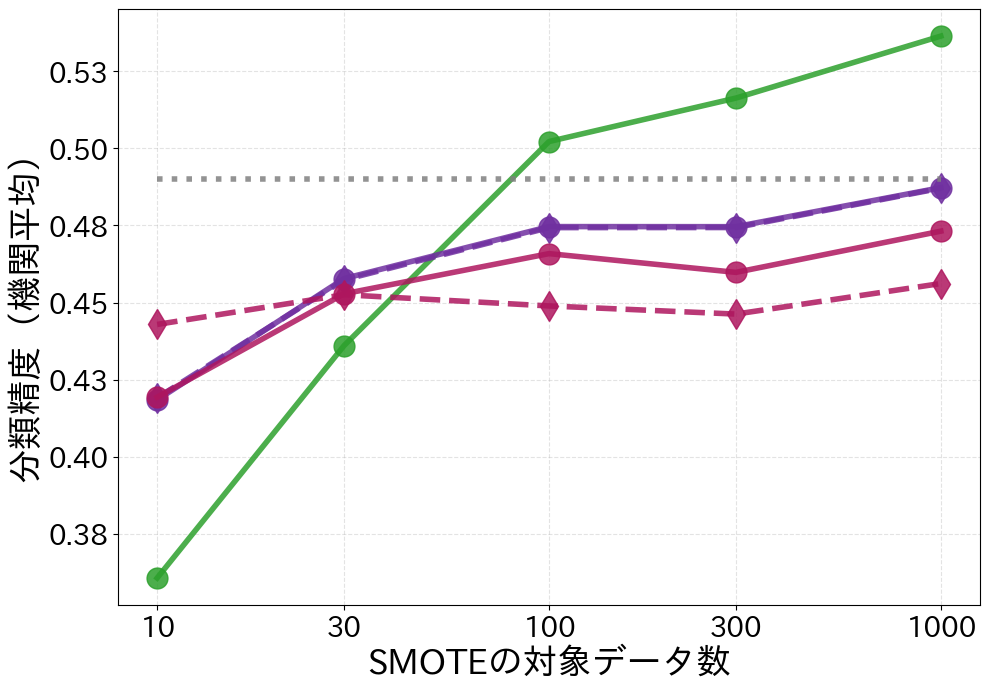

In [34]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_new_smote_mnist_5",
    dataset="",
    csv_name="result_grid_mnist.csv",
    x_col="public_anchor_num",
    defaults=DEFAULTS,
    for_slide=True,
)

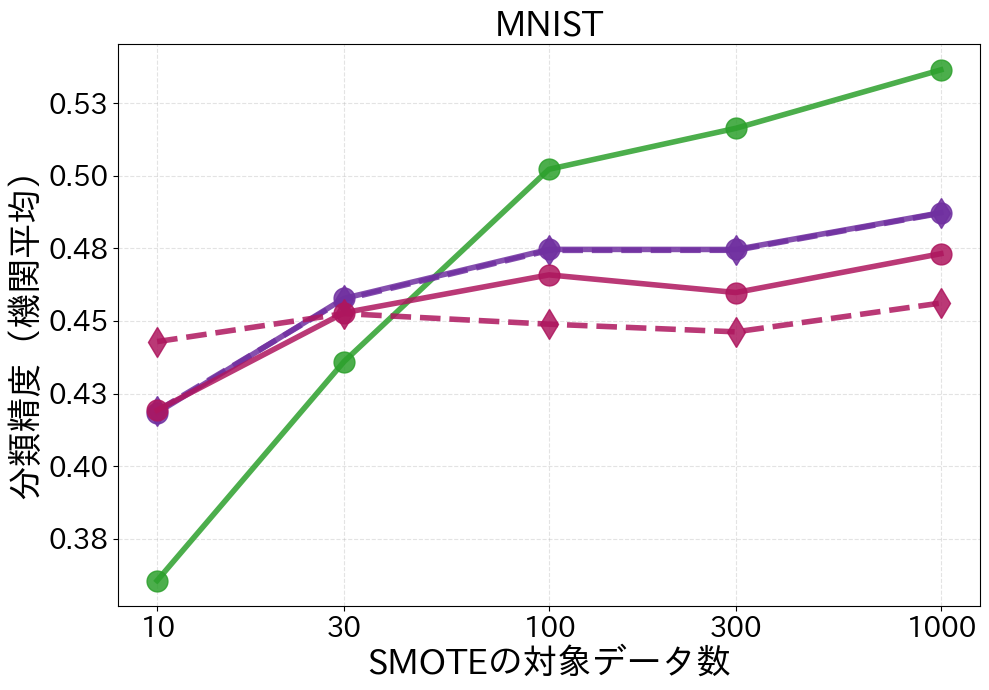

In [32]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_new_smote_mnist_5",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="public_anchor_num",
    defaults=DEFAULTS,
    for_slide=True,
)

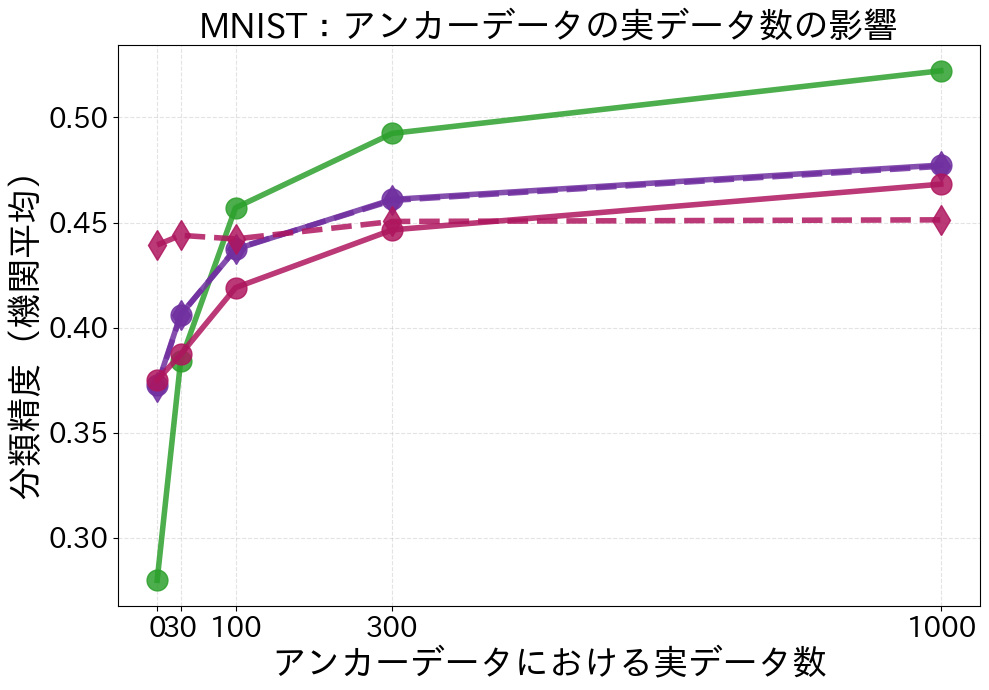

In [18]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_new_smote_mnist",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
    for_slide=True,
)

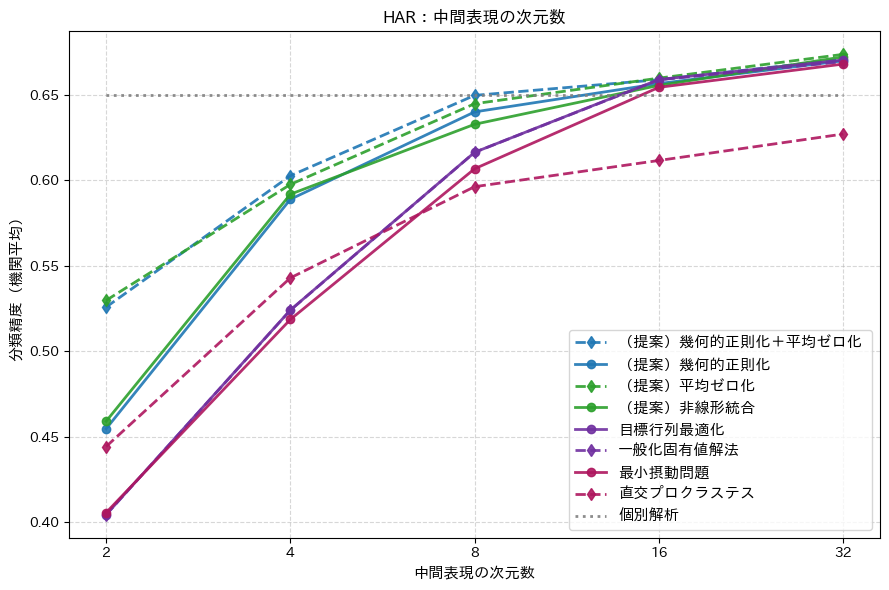

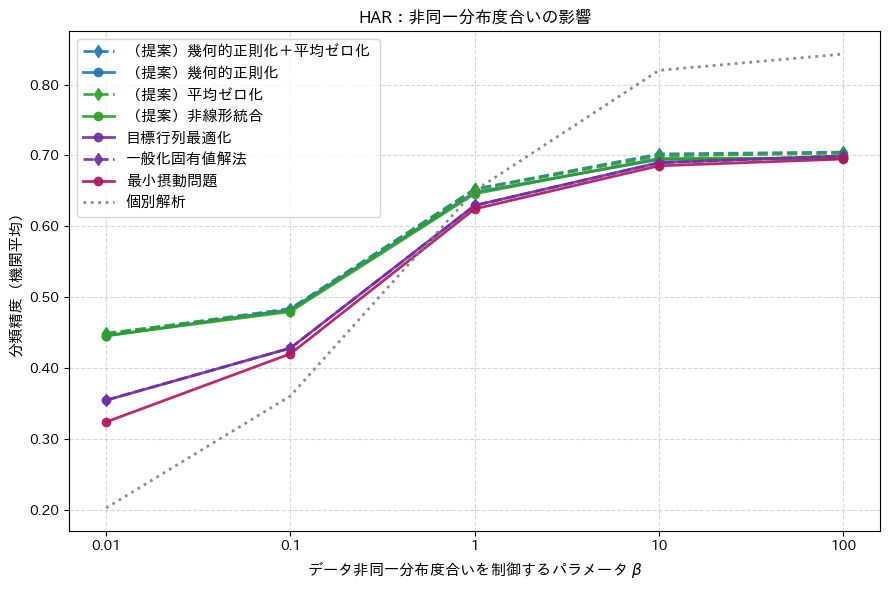

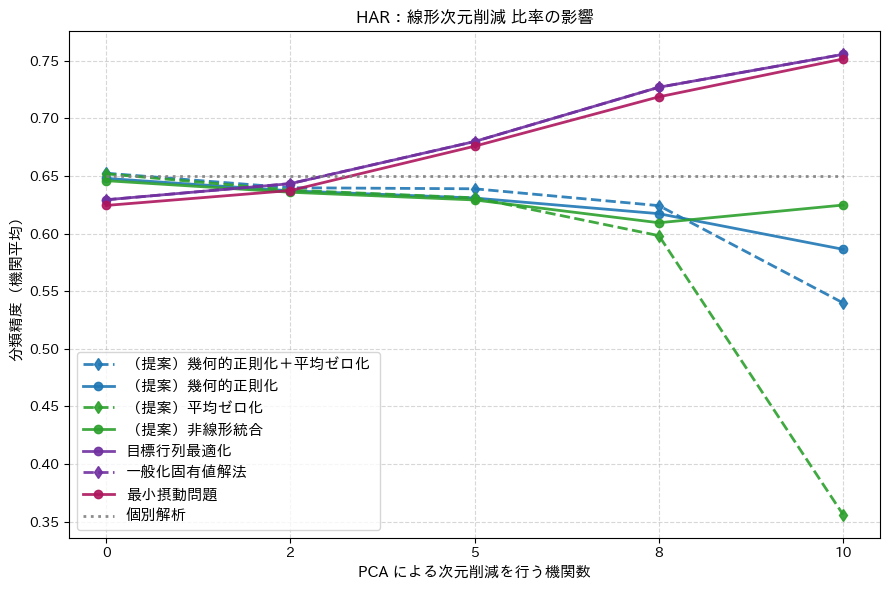

In [109]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_har",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
    for_slide=False,
)


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_har",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
    for_slide=False,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_har",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
    for_slide=False,
)

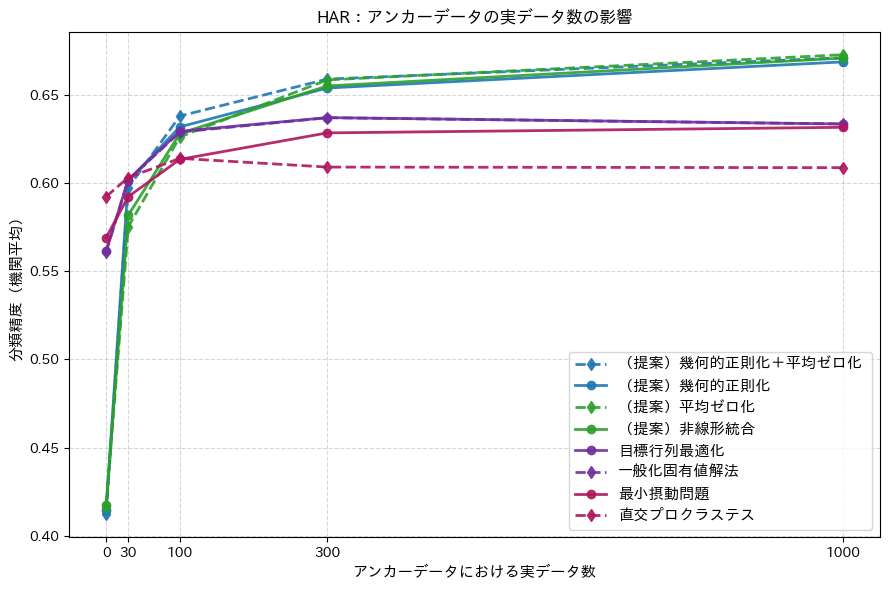

In [112]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0204_new_smote",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
    for_slide=False,
)

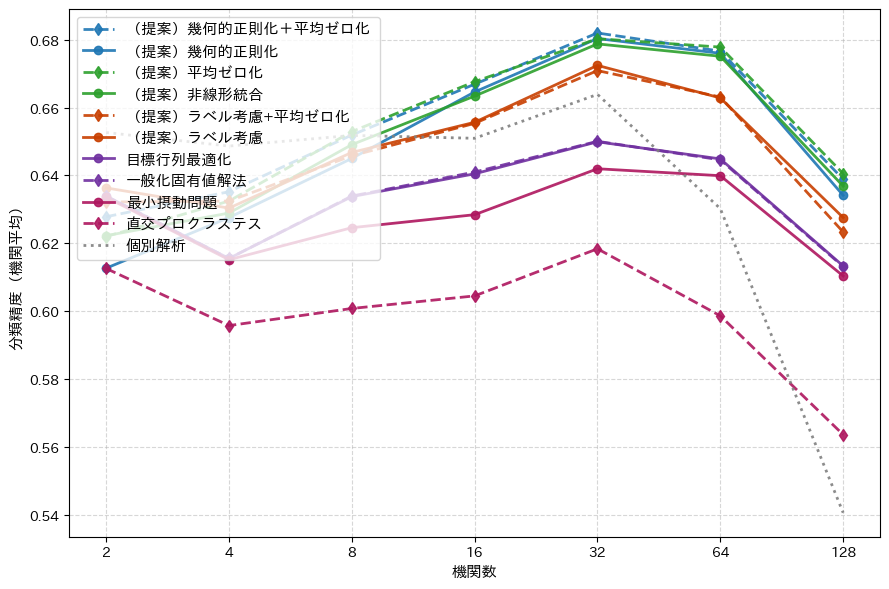

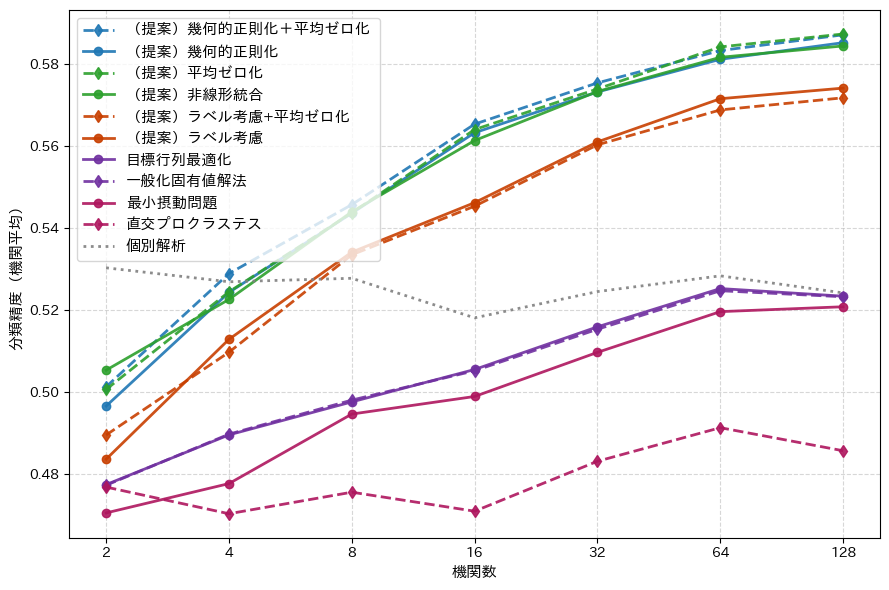

In [110]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0202_nuw_num_128",
    dataset="",
    csv_name="result_grid_har.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    for_slide=False,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0202_nuw_num_128",
    dataset="",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    for_slide=False,
)

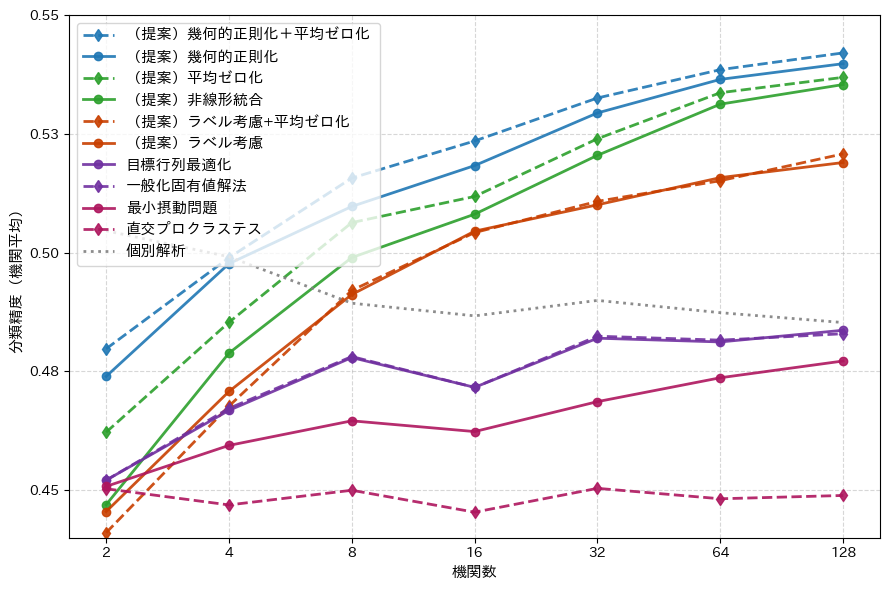

In [103]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="",
    csv_name="result_grid_mnist_graph_ind.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    only_ticks=True,   # ← 追加
    for_slide=False,
    y_ticks=[0.44, 0.55]
)

# new

In [72]:
DEFAULTS = {
    #"svd_ratio": 0,                 # ← 可視化時はここを無視
    "non_iid_beta": 1,
    "sub_dr_ratio": 0,
    "num_institution": 10,
    "dim_intermediate": 10,
    "smote_ratio": 1.0,
}

load_filter_and_plot_bar(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="MNIST",
    csv_name="result_grid_mnist_num_50.csv",
    defaults=DEFAULTS,
    num_institution=50,
    for_slide=True,
)

ValueError: No data left after DEFAULTS + num_institution filtering.

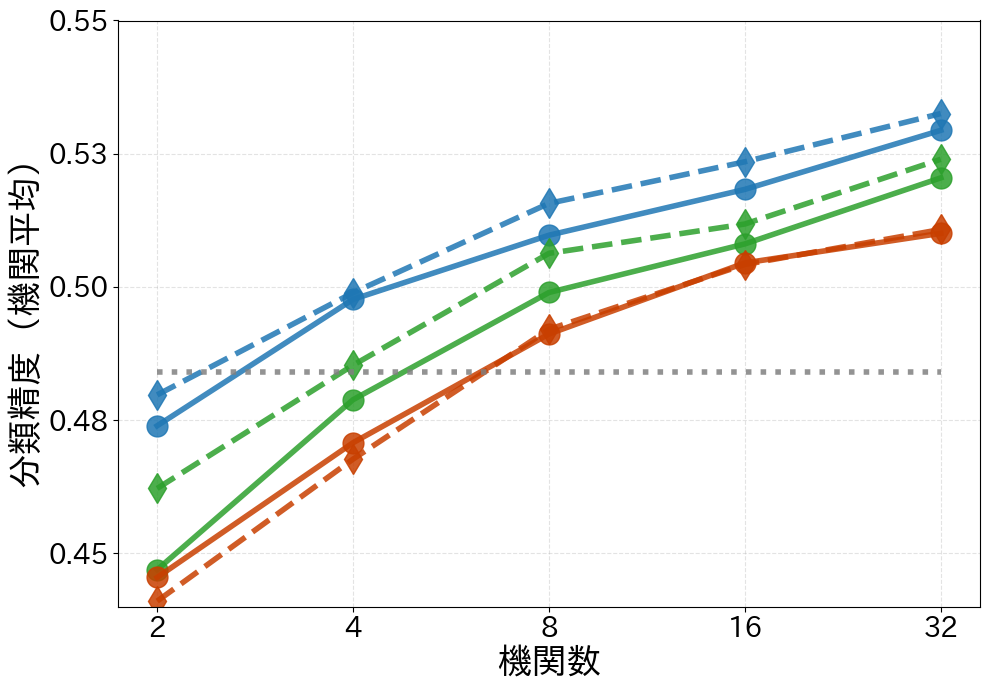

In [28]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="",
    csv_name="result_grid_mnist_graph_ind_updated.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    only_ticks=True,   # ← 追加
    for_slide=True,
    y_ticks=[0.44, 0.55]
)

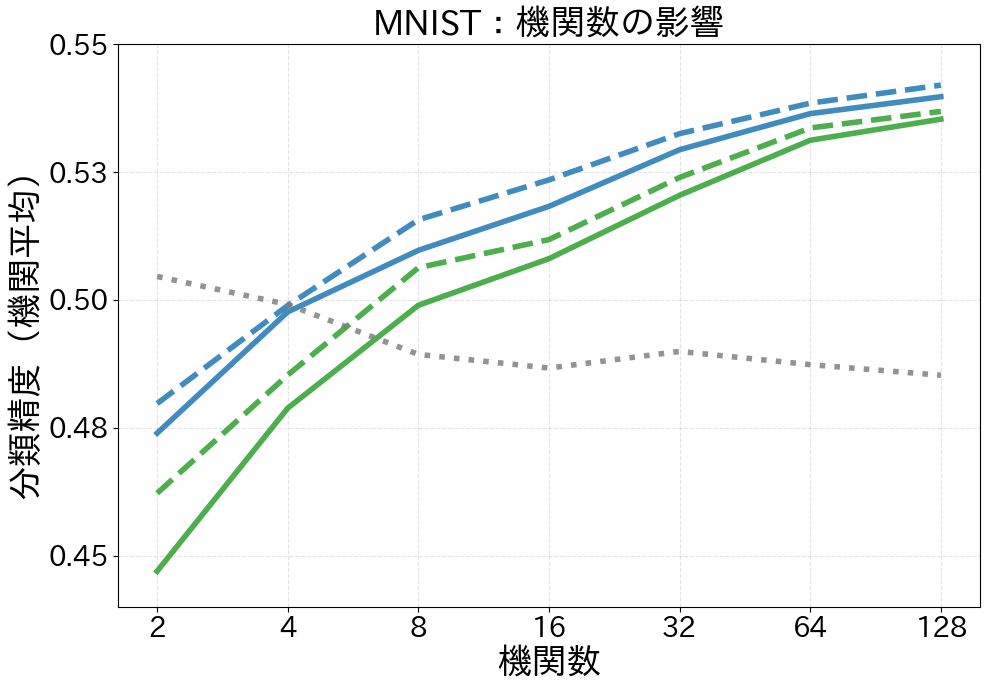

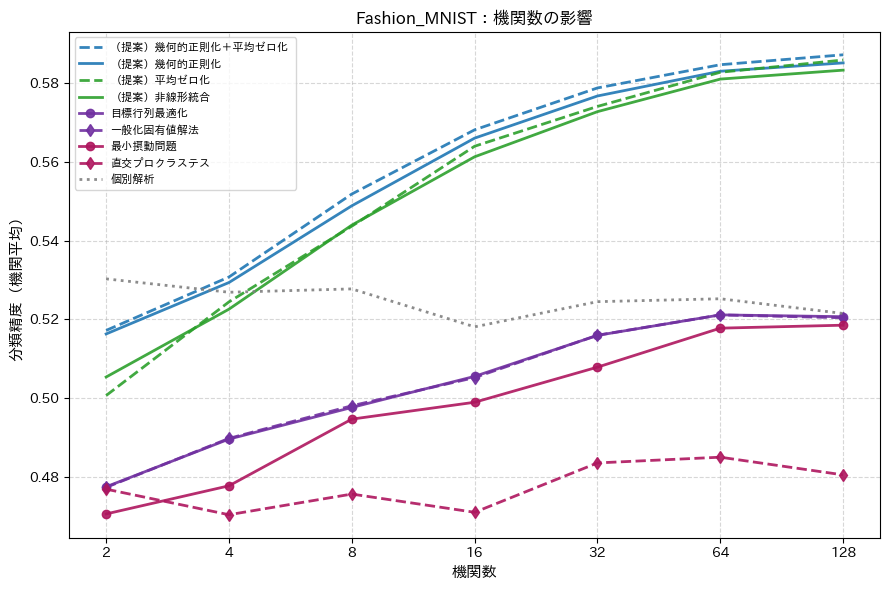

In [141]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="MNIST",
    csv_name="result_grid_mnist_num.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    only_ticks=True,   # ← 追加
    for_slide=True,
    y_ticks=[0.44, 0.55]
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    only_ticks=True,   # ← 追加
    #for_slide=True,
)

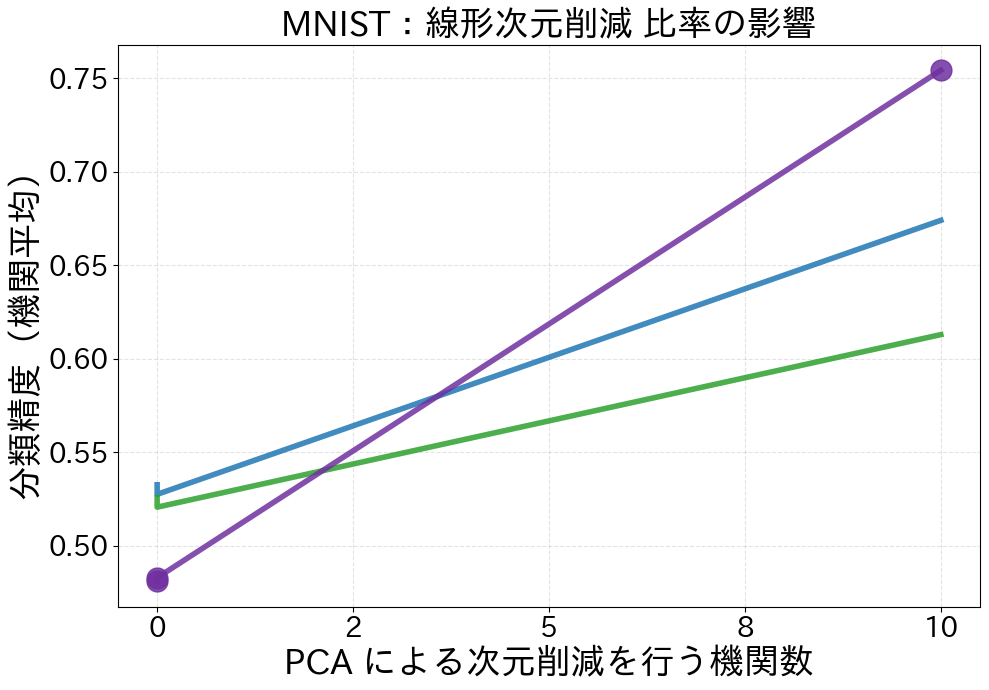

In [142]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
    for_slide=True,
)

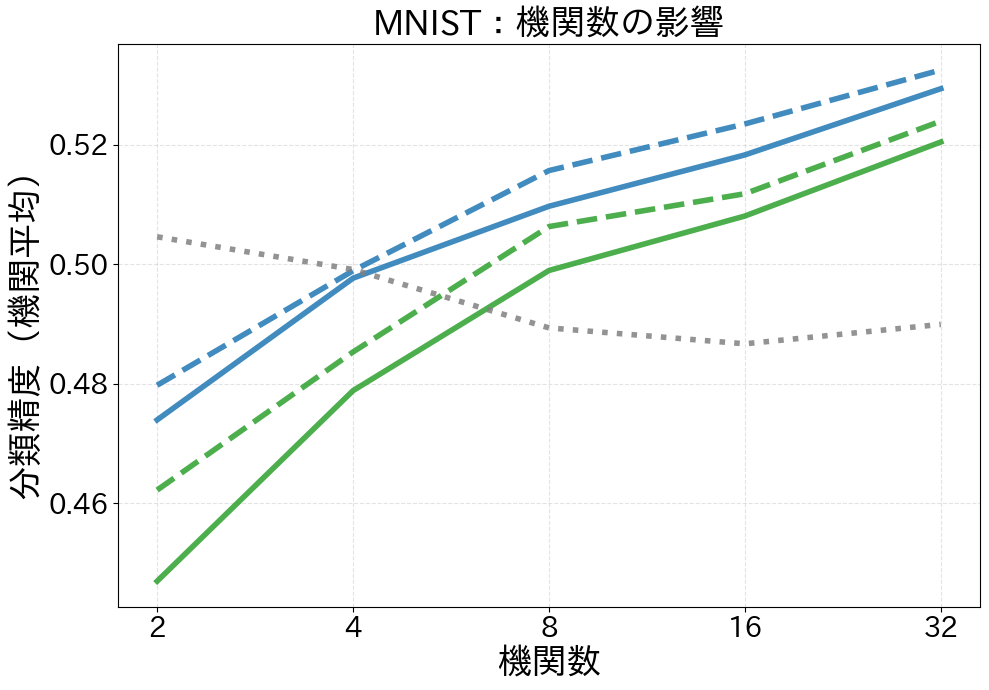

ValueError: No data left after DEFAULTS filtering.

In [143]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_0119.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    #only_ticks=True,   # ← 追加
    for_slide=True,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_0119.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
    for_slide=True,
)

# load_filter_and_plot(
#     path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
#     dataset="MNIST",
#     csv_name="result_grid_mnist_0119.csv",
#     x_col="non_iid_beta",
#     defaults=DEFAULTS,
# )

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist_0119.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    for_slide=True,   # ← スライド用
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist_0119.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
    for_slide=True,   # ← スライド用
)

# load_filter_and_plot(
#     path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
#     dataset="Fashion_MNIST",
#     csv_name="result_grid_fashion_mnist_0119.csv",
#     x_col="non_iid_beta",
#     defaults=DEFAULTS,
# )

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_0119.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_0119.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist_0119.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist_0119.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_0119.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist_0119.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

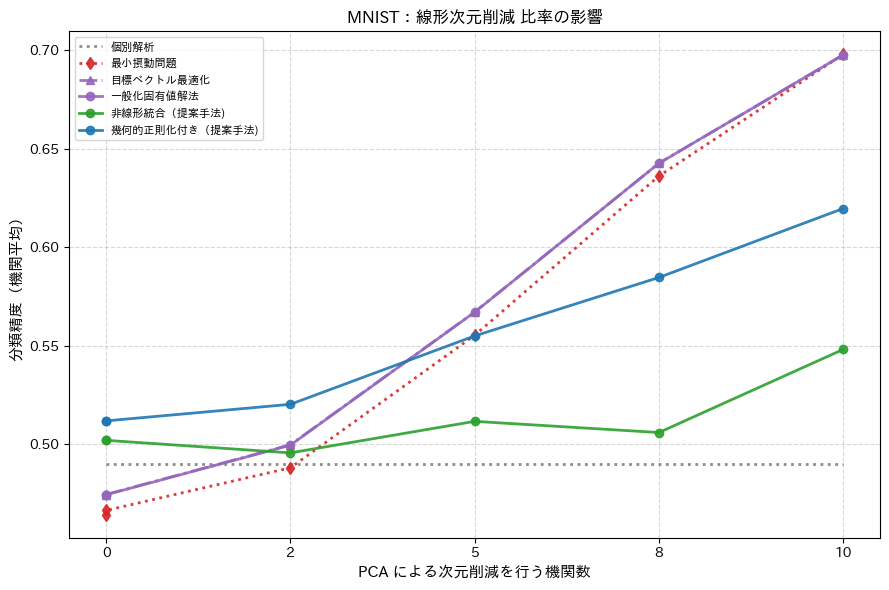

In [30]:
DEFAULTS = {
    #"svd_ratio": 0,                 # ← 可視化時はここを無視
    "public_anchor_num": 100,
    "non_iid_beta": 1,
    "sub_dr_ratio": 0,
    "num_institution": 10,
    "dim_intermediate": 10,
    "smote_ratio": 1.0,
}

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

In [144]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="MNIST",
    csv_name="result_grid_mnist_smote.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0118_new_subdr_num",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist_smote.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

ValueError: No data left after DEFAULTS filtering.

# old

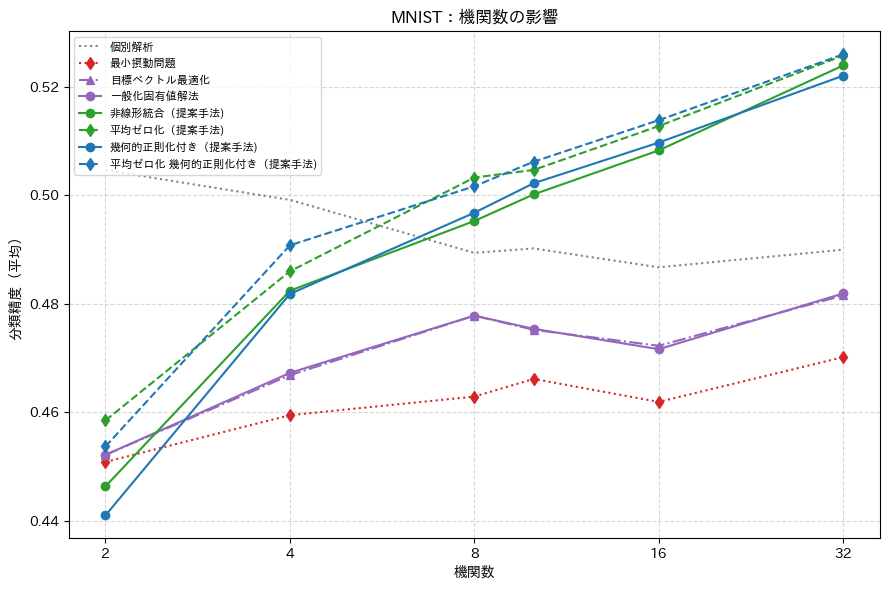

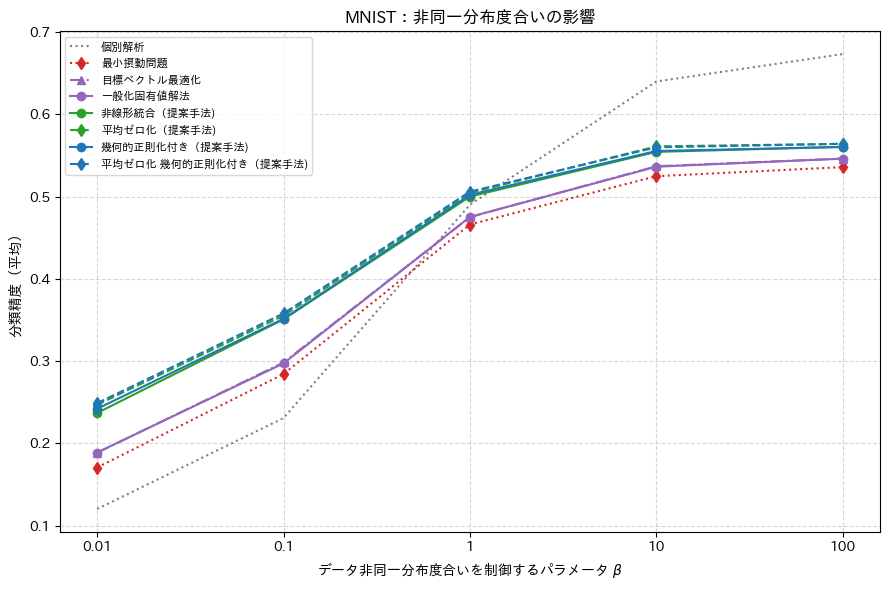

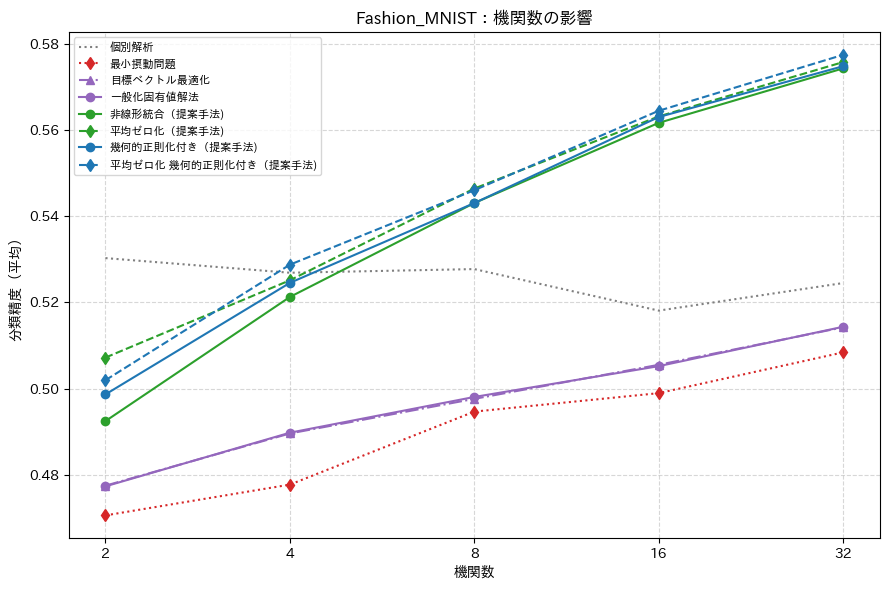

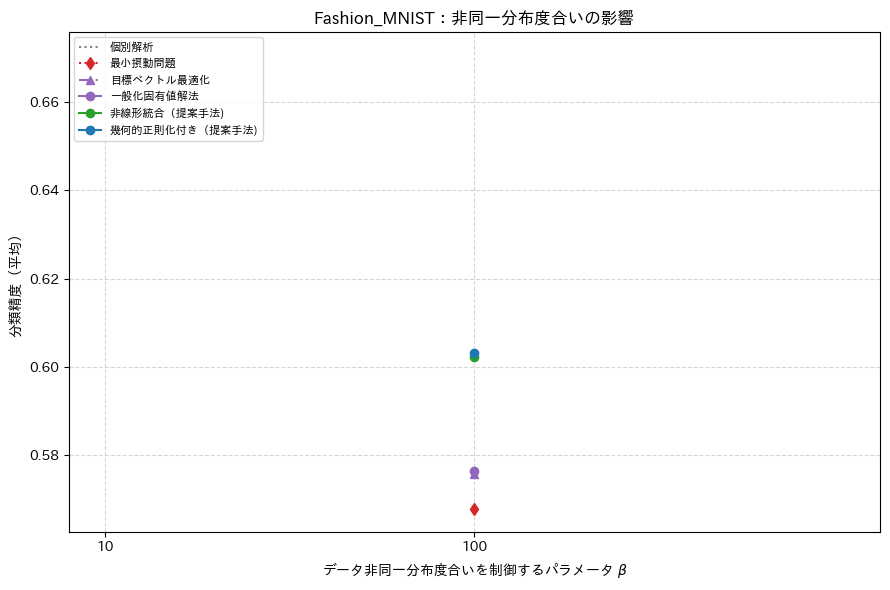

In [79]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim_normal",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim_normal",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim_normal",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim_normal",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

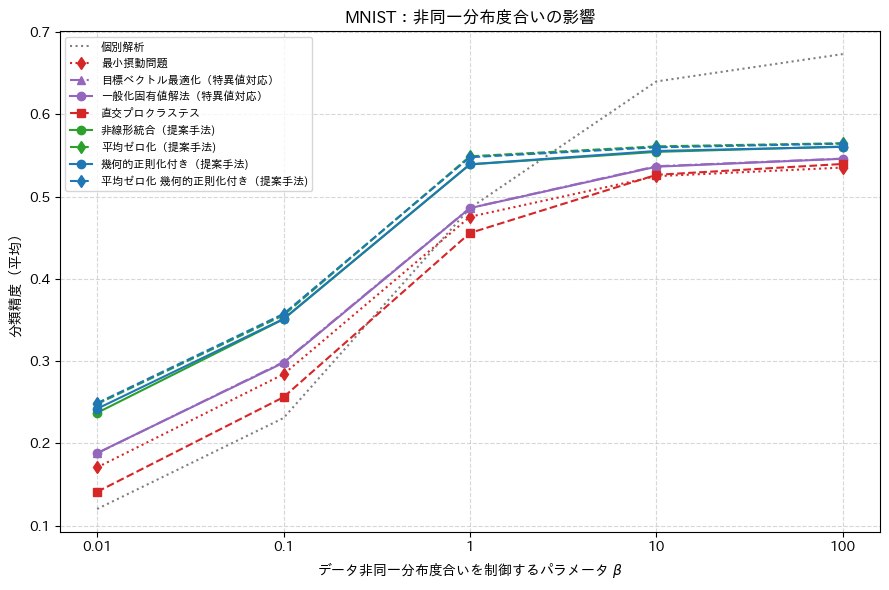

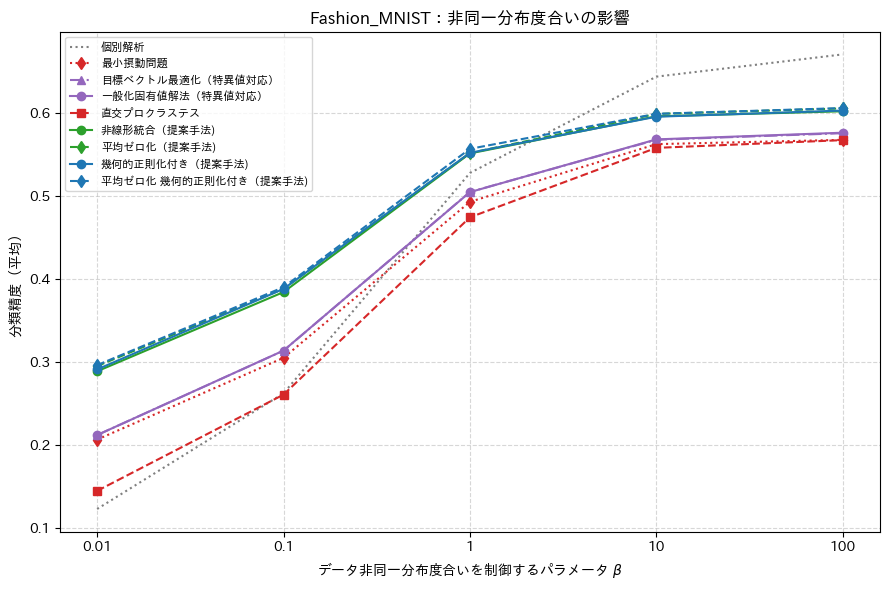

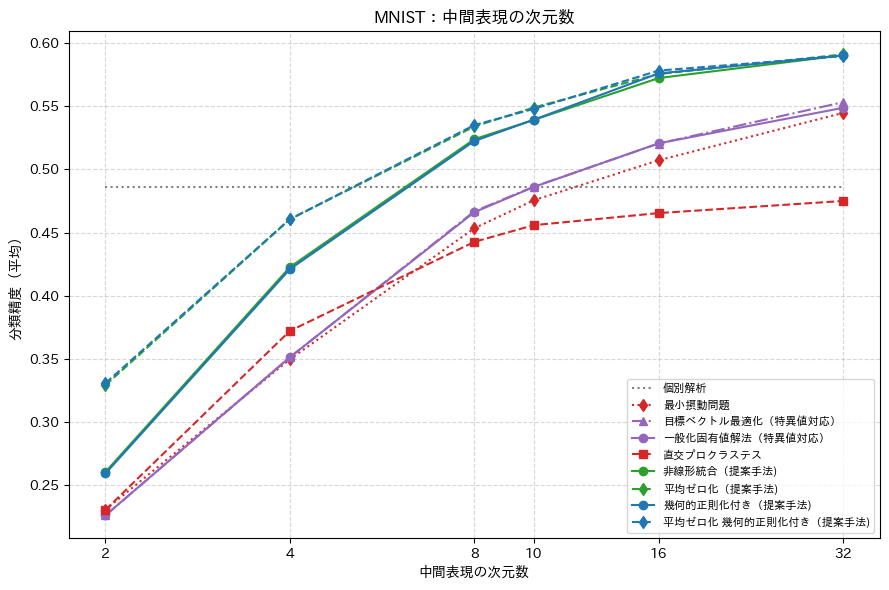

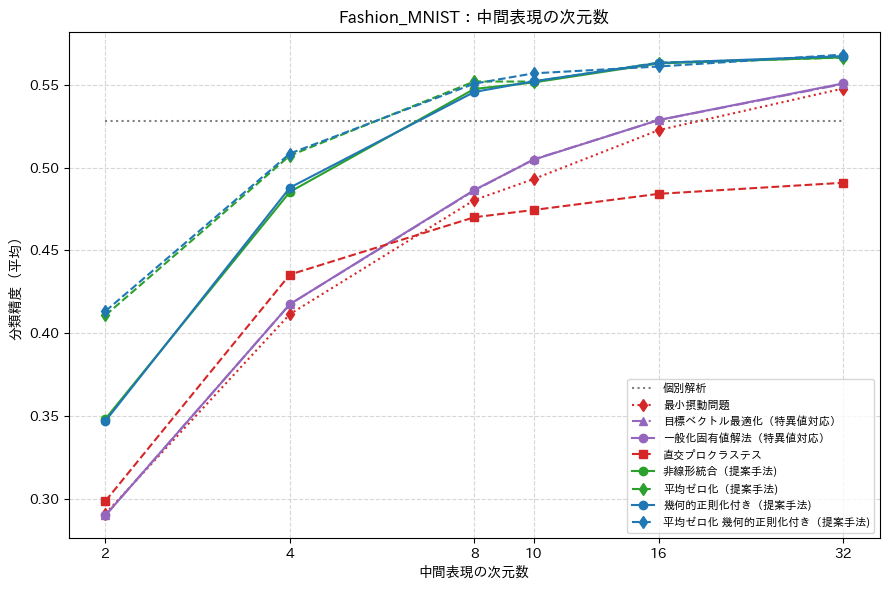

In [72]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_dim_noniid_normal",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_dim_noniid_normal",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_dim_noniid_normal",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_dim_noniid_normal",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

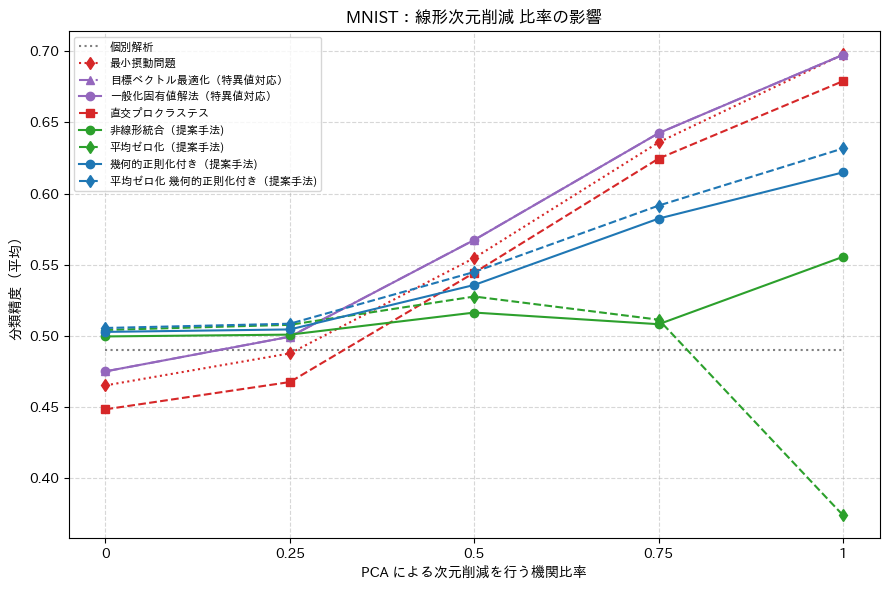

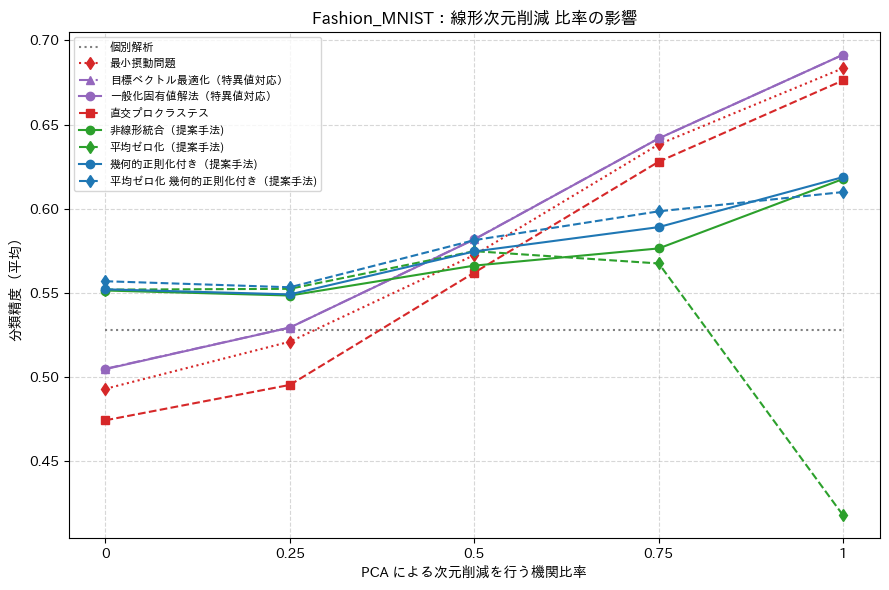

In [64]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_normal",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_normal",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

In [199]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_smote_normal",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_smote_normal",
    dataset="Fashion_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

ValueError: No data left after DEFAULTS filtering.

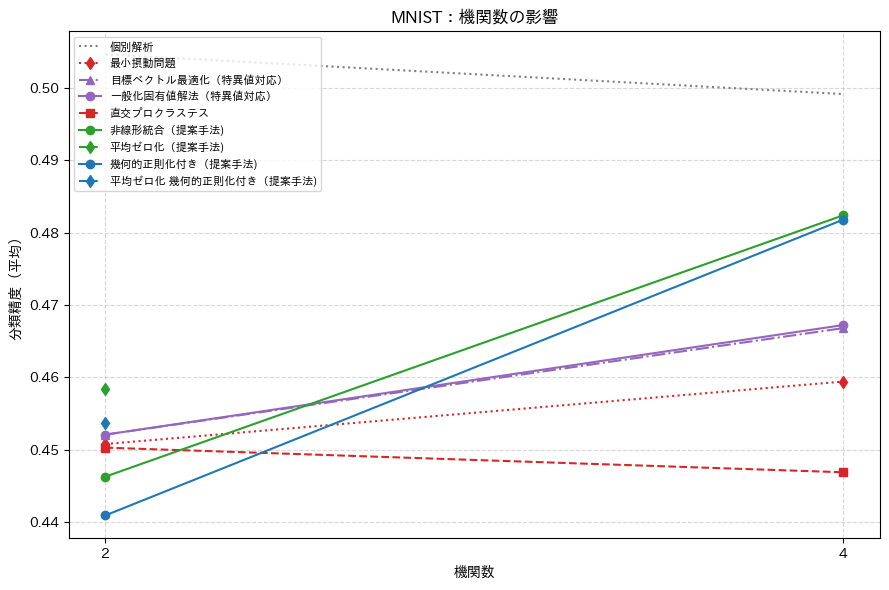

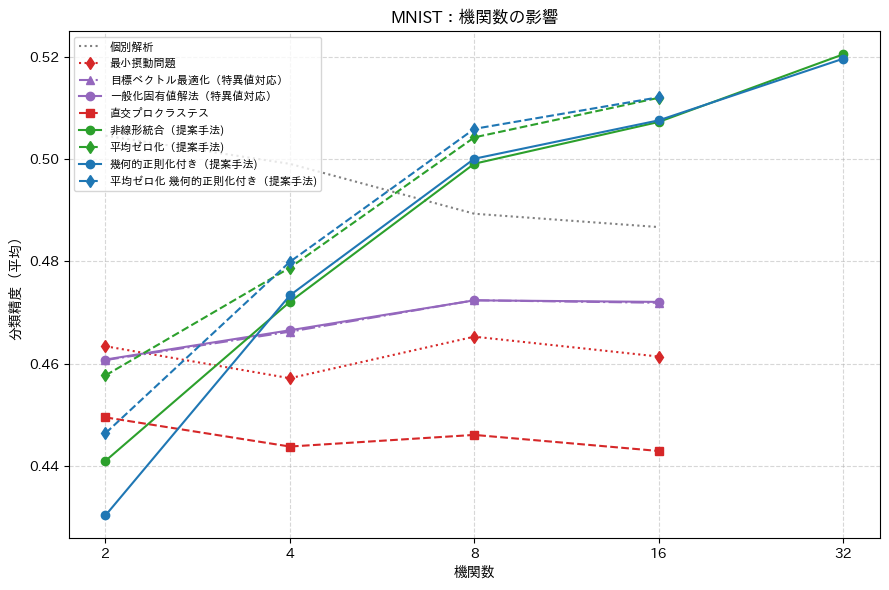

In [20]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim_process",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim_process",
    dataset="MNIST",
    csv_name="result_grid_mnist_2.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

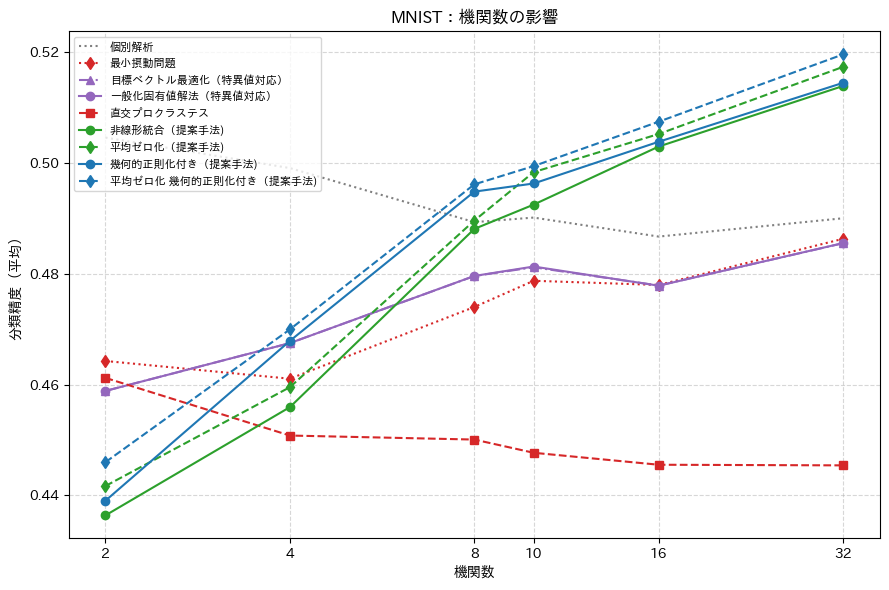

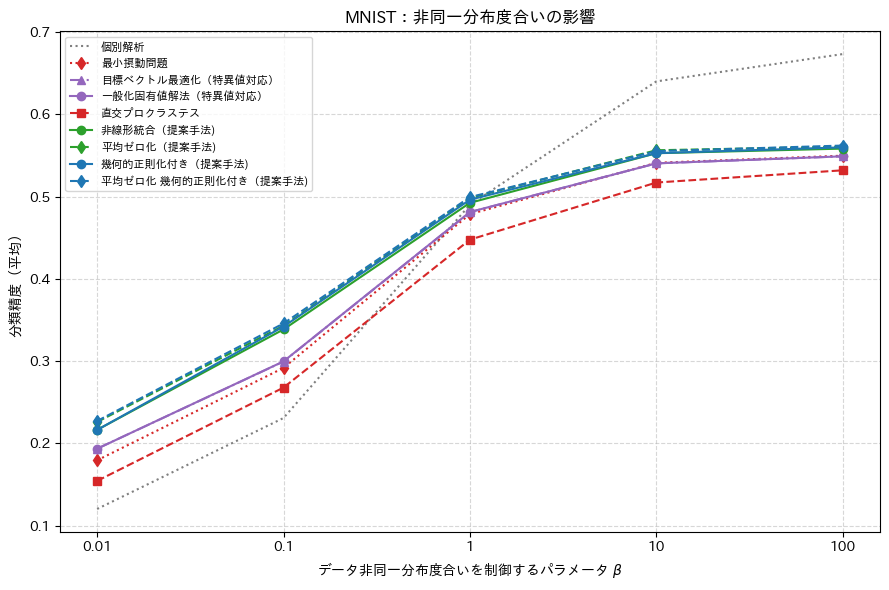

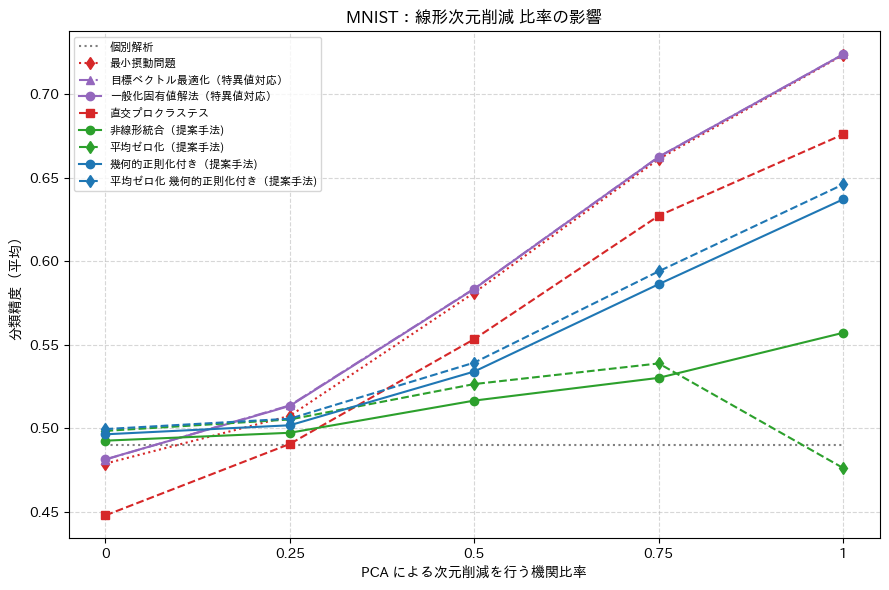

In [40]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)


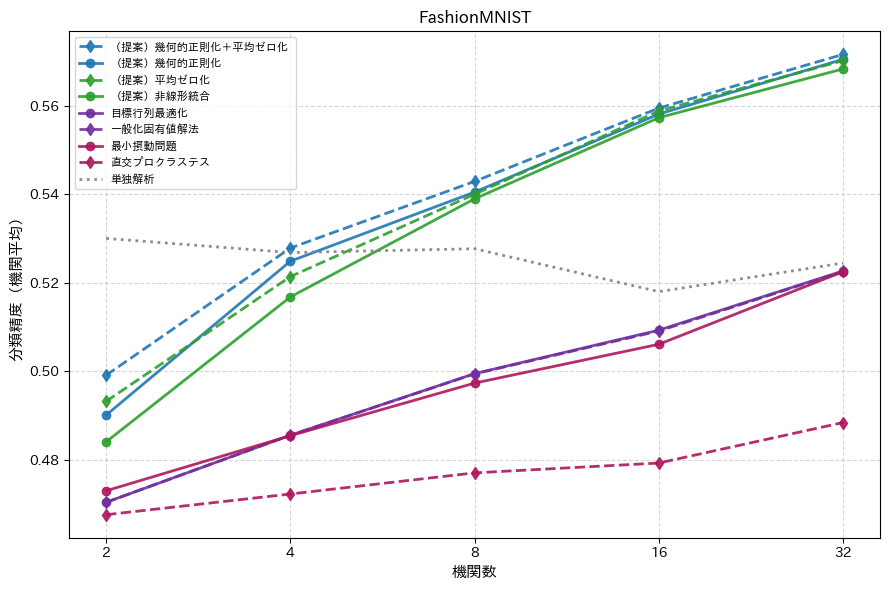

ValueError: No data left after DEFAULTS filtering.

In [198]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="FashionMNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="FashionMNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="FashionMNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

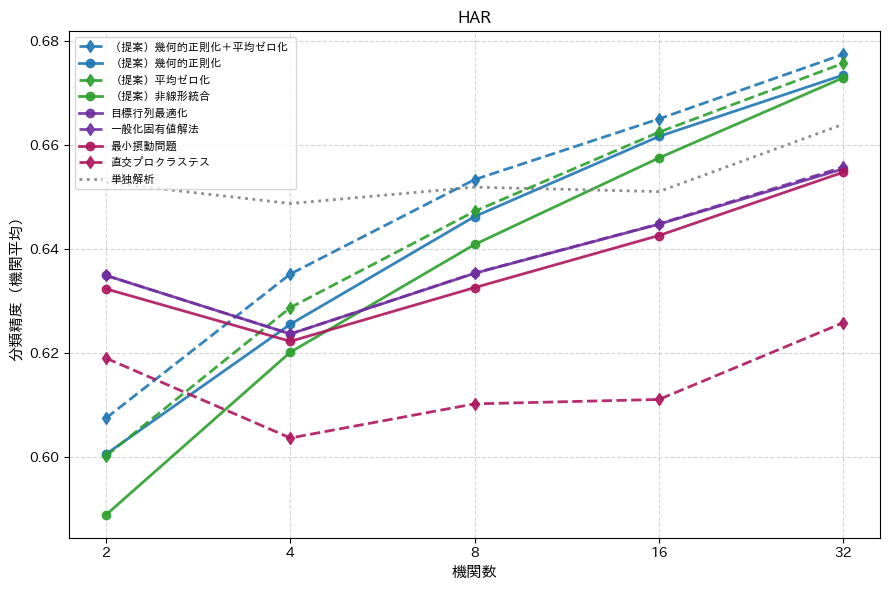

In [21]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
    for_slide=False,
)

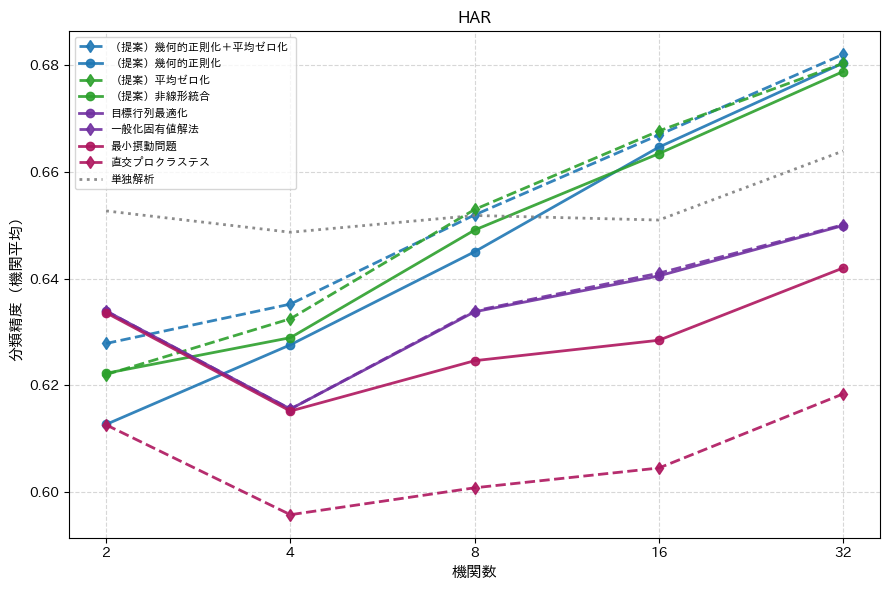

In [12]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0202_nuw_num_128",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

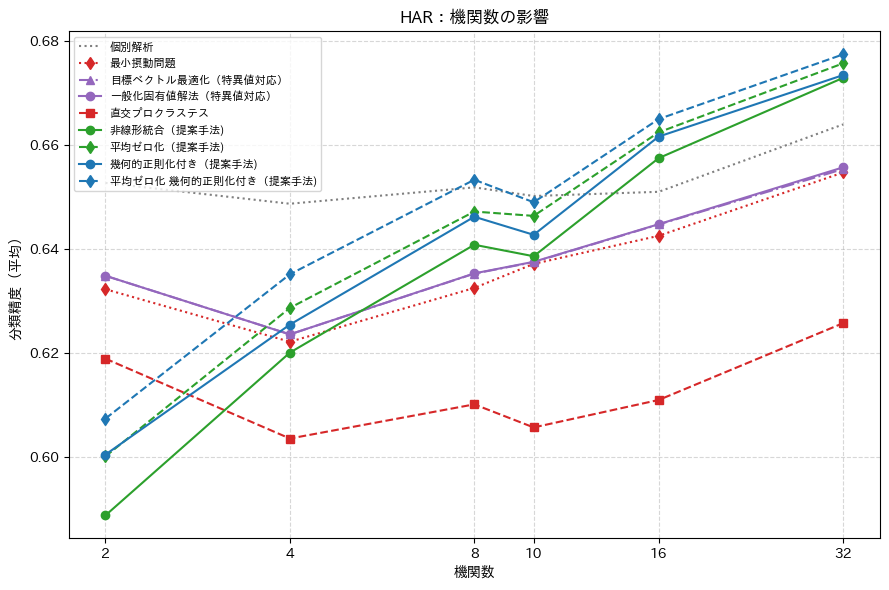

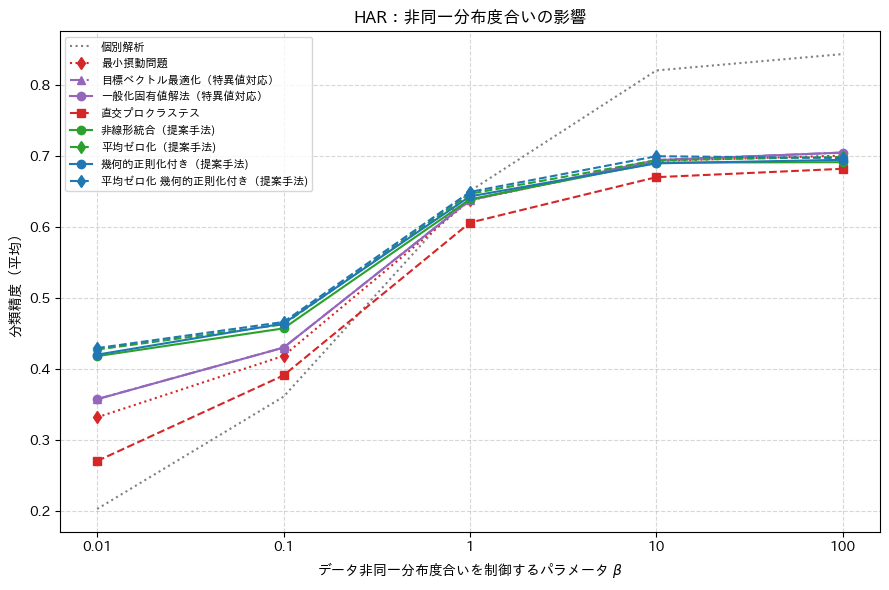

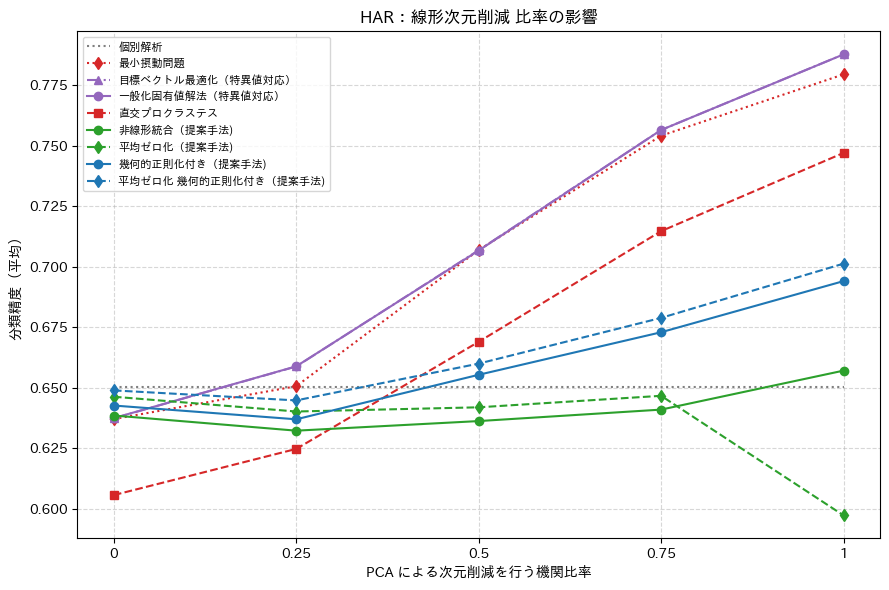

In [42]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0111_subdr_noniid_numinst_dim",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

### old

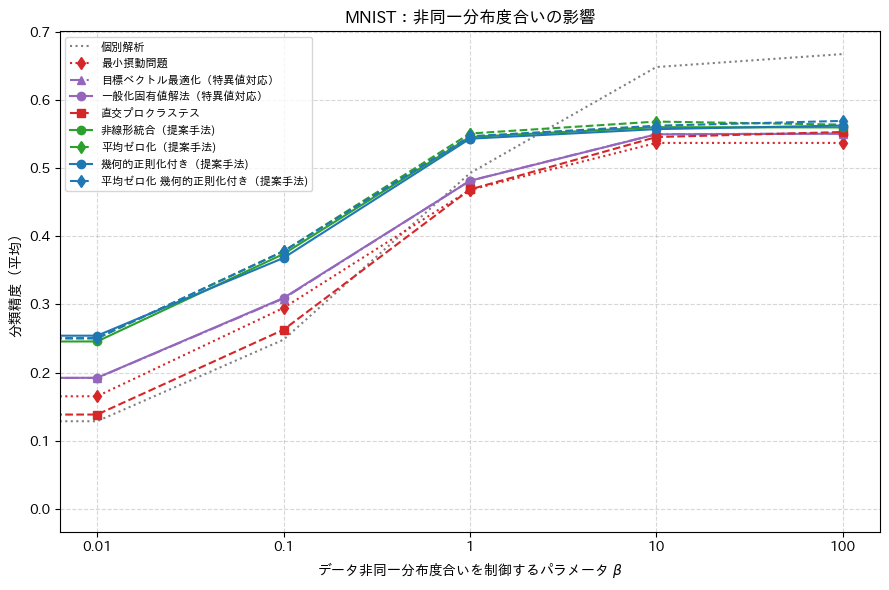

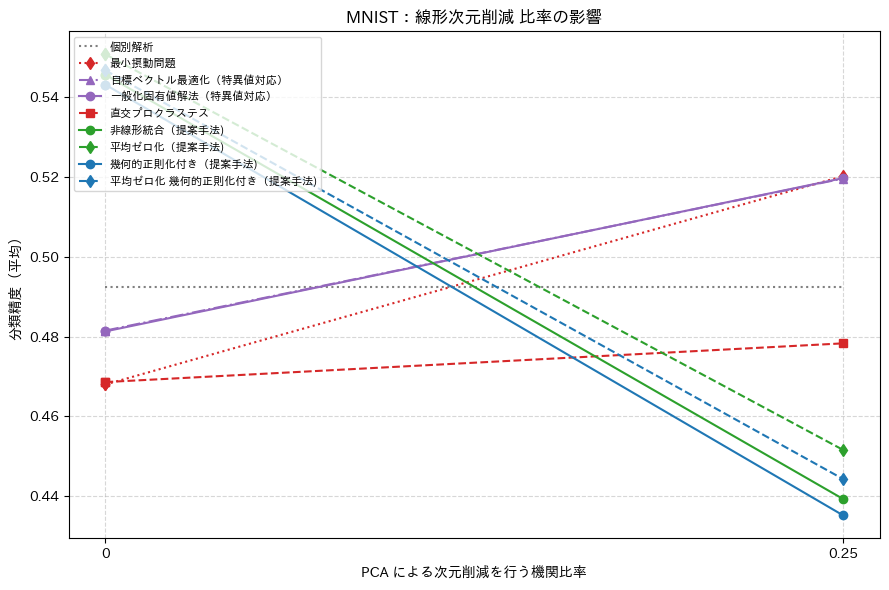

In [39]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0110_noniid_normalization",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0110_noniid_normalization",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

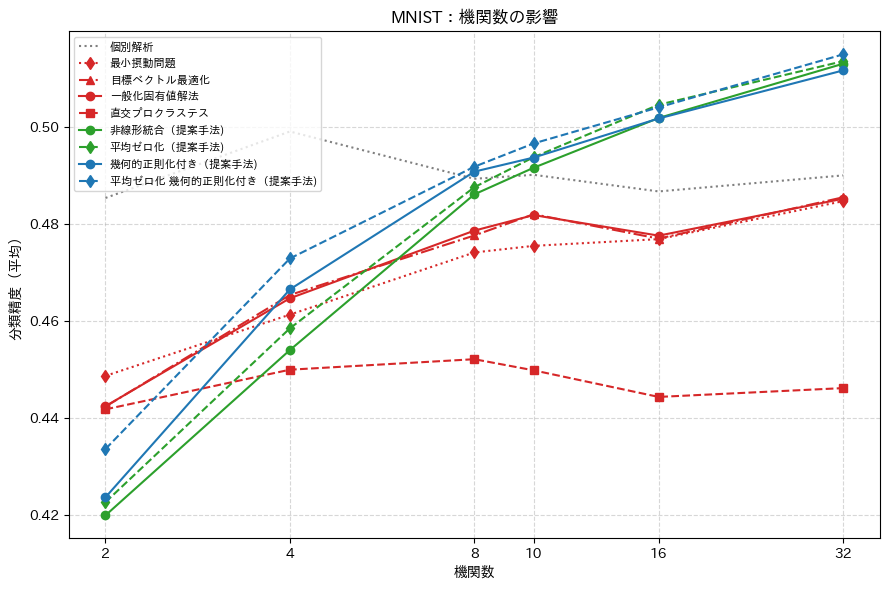

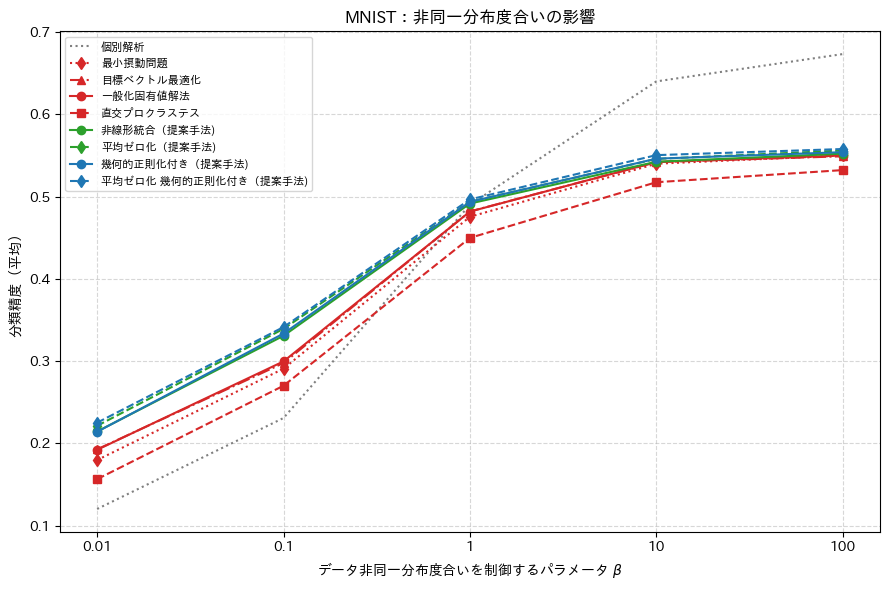

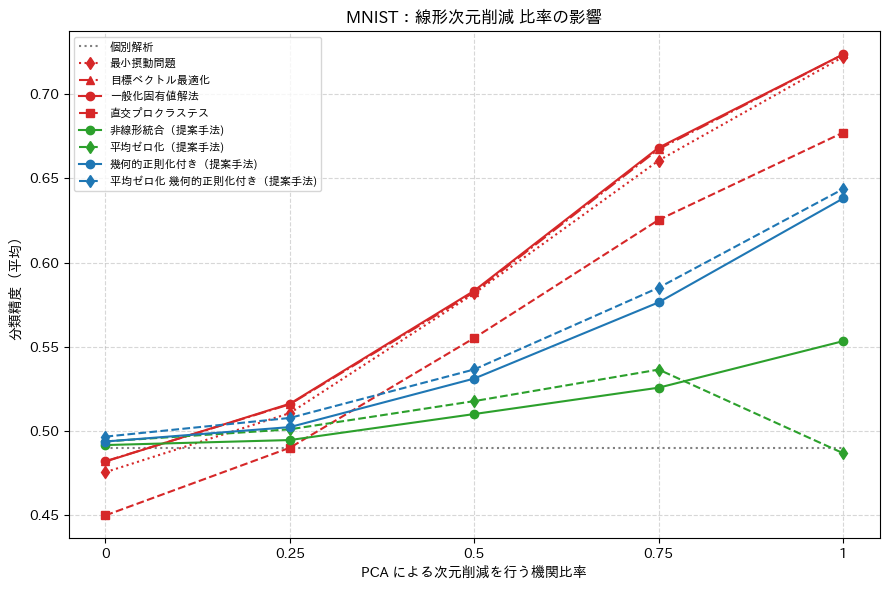

In [6]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)


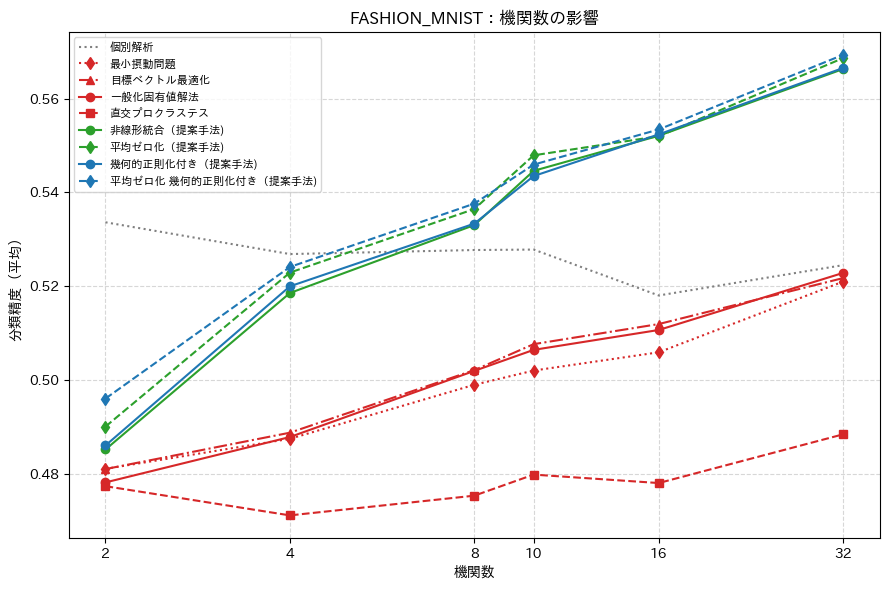

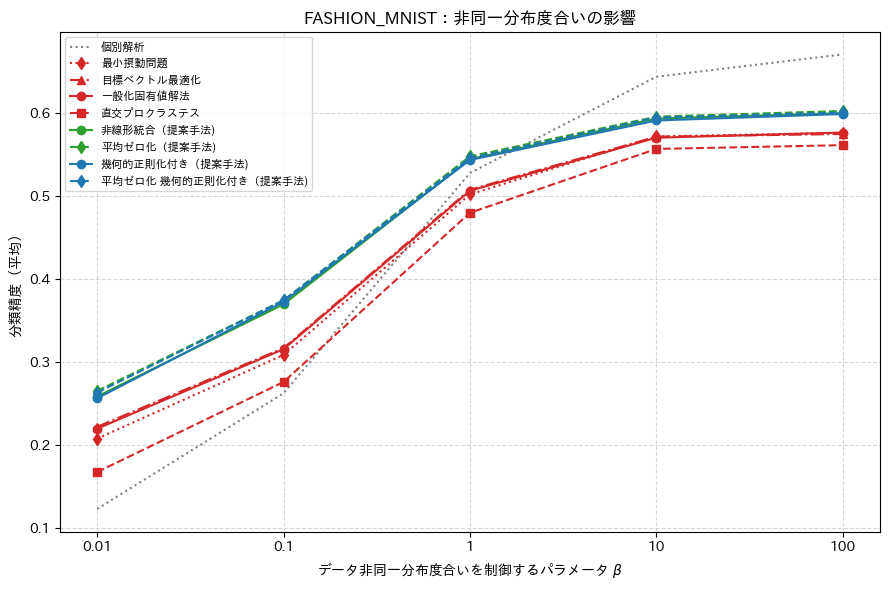

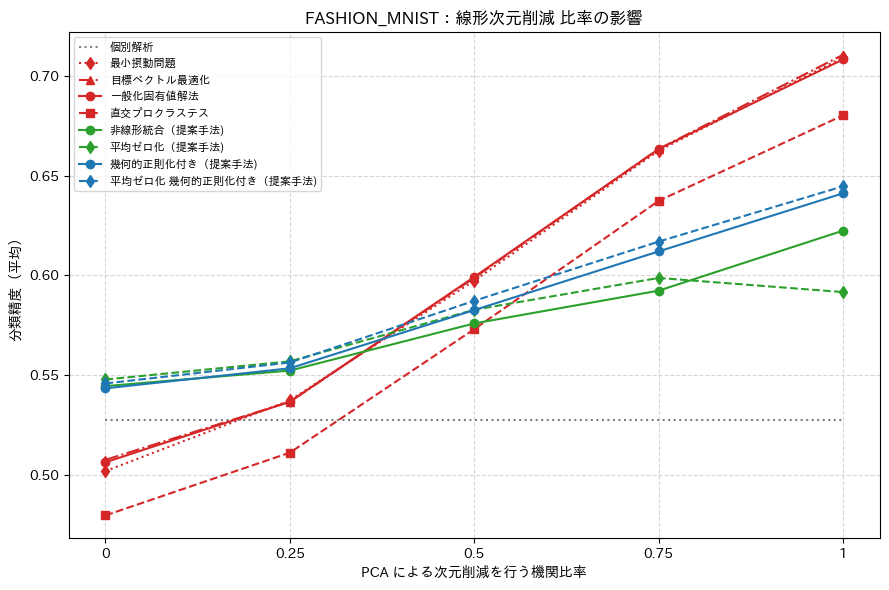

In [208]:


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)


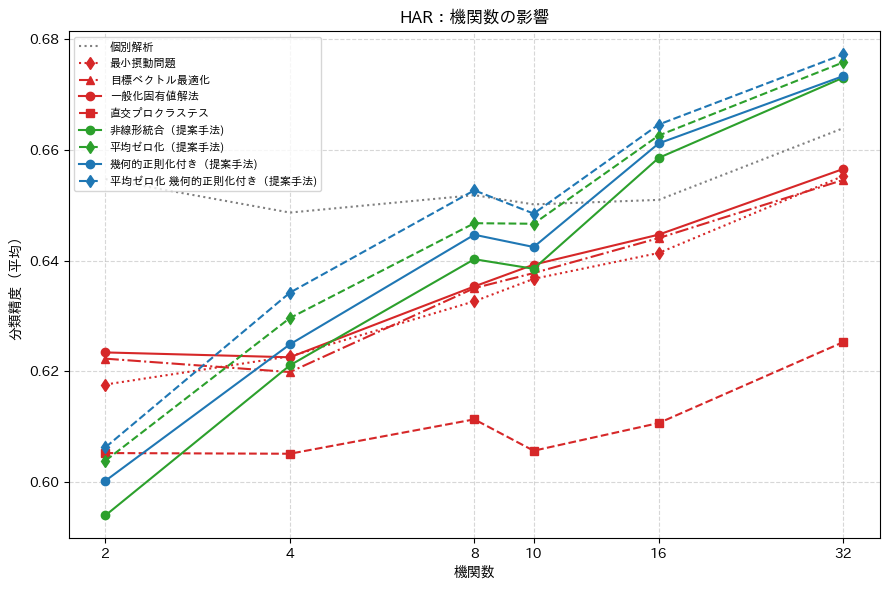

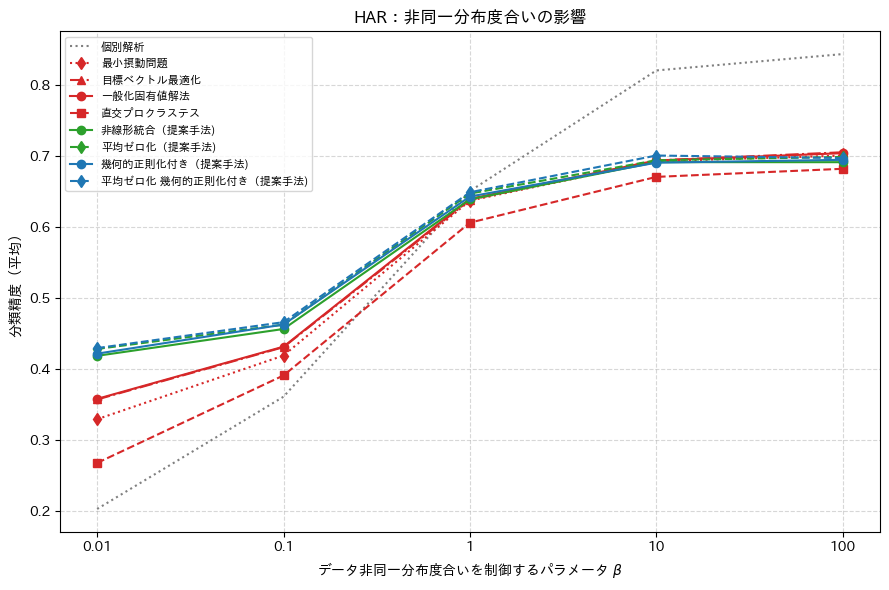

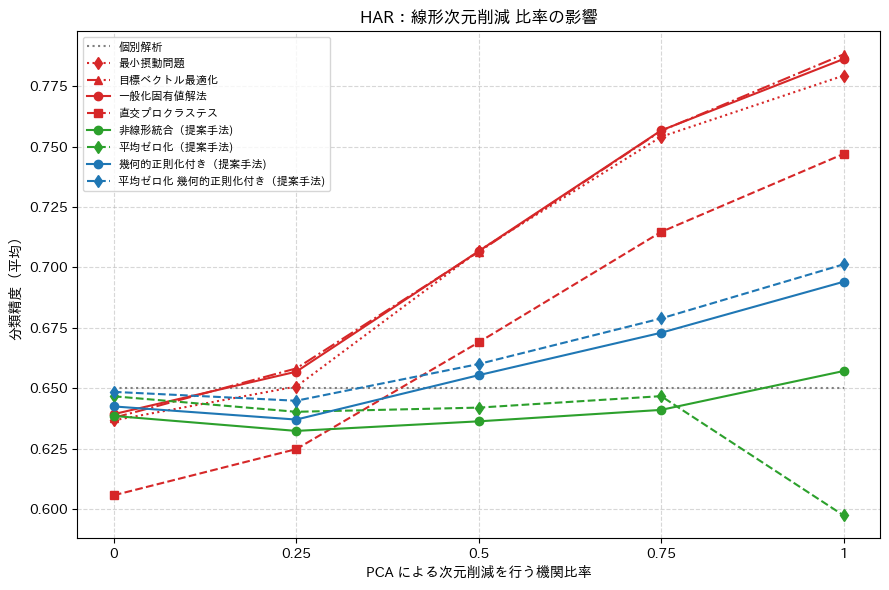

In [209]:


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_har_sub_dr_noniid_num_inst",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_har_sub_dr_noniid_num_inst",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_har_sub_dr_noniid_num_inst",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)


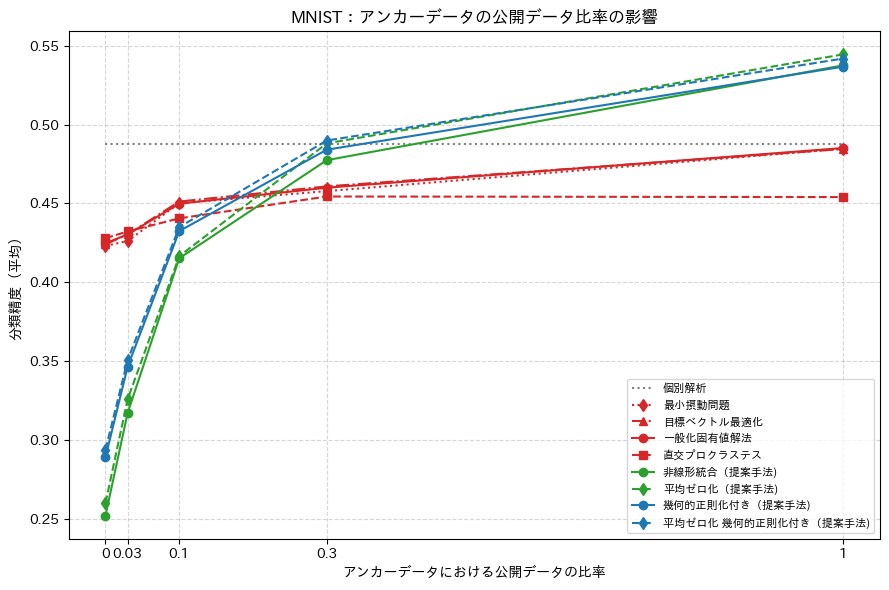

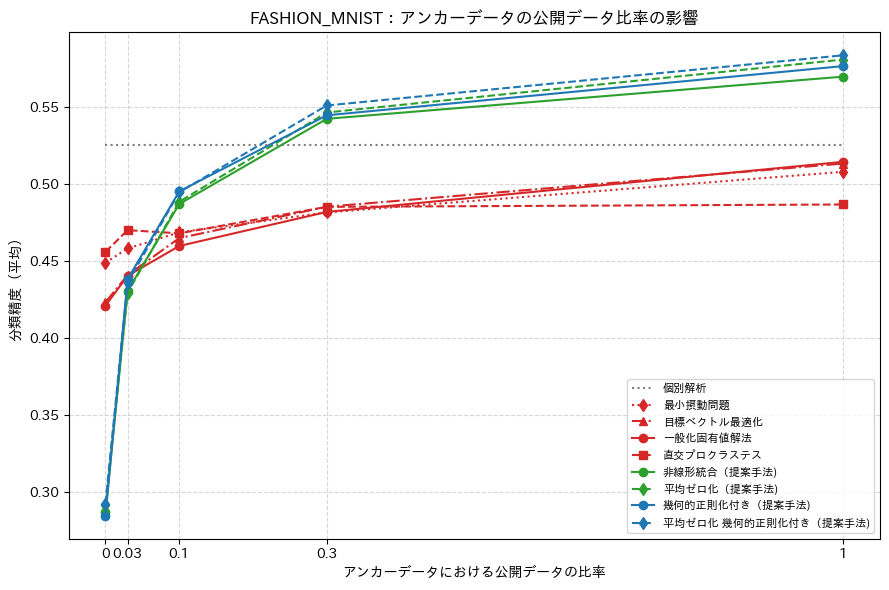

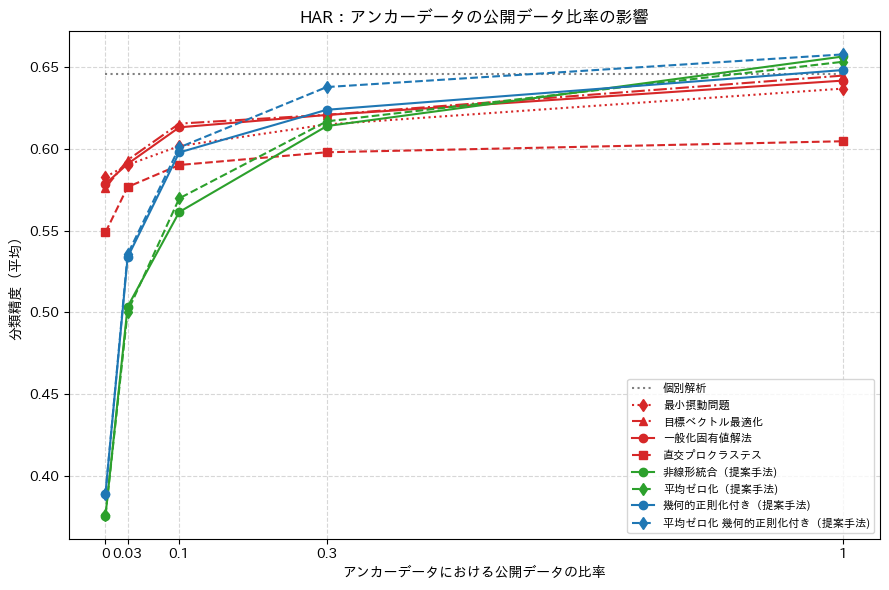

In [210]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0107_smote_7",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0107_smote_7",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0107_smote_7",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

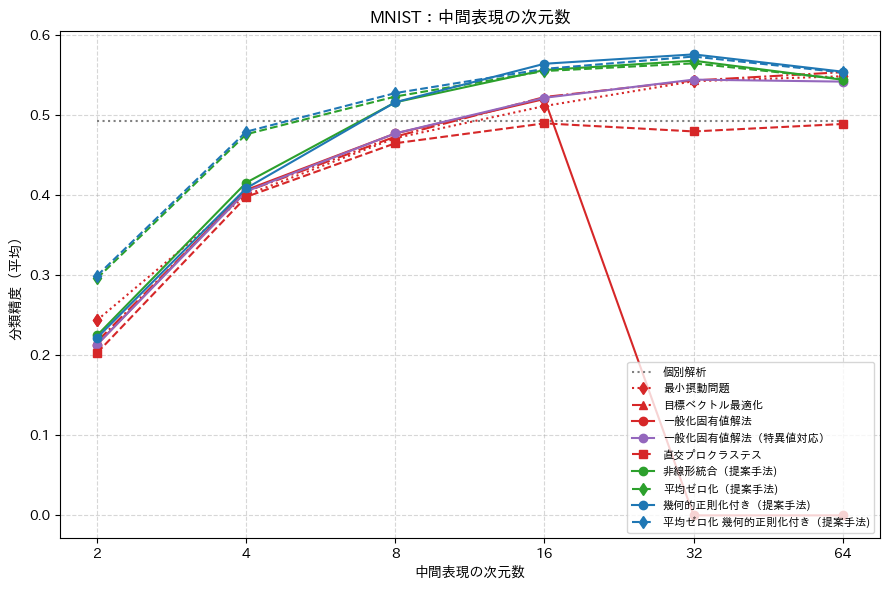

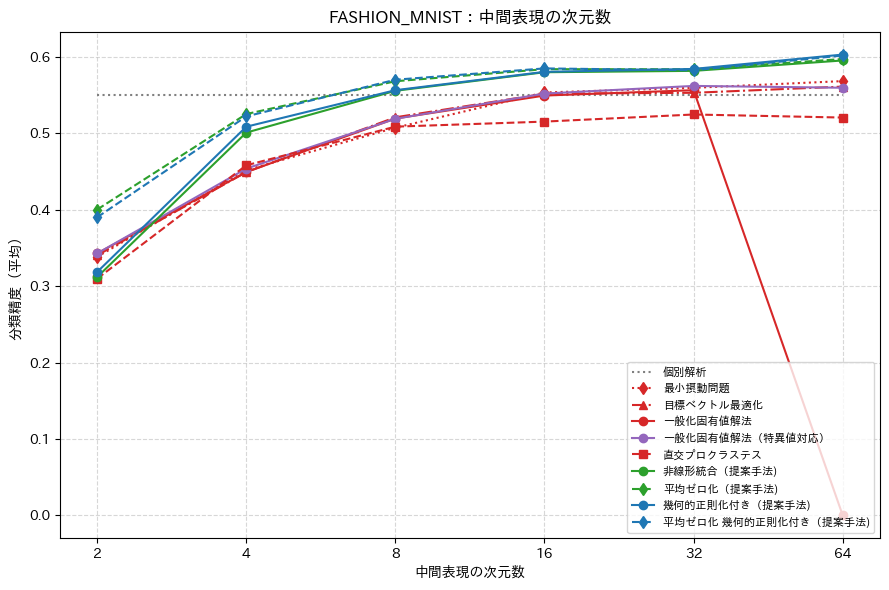

FileNotFoundError: [Errno 2] No such file or directory: '/Users/suetake/git-repos/takano_labo/dca/output/0106_dim/result_grid_har.csv'

In [33]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_dim",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_dim",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_dim",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

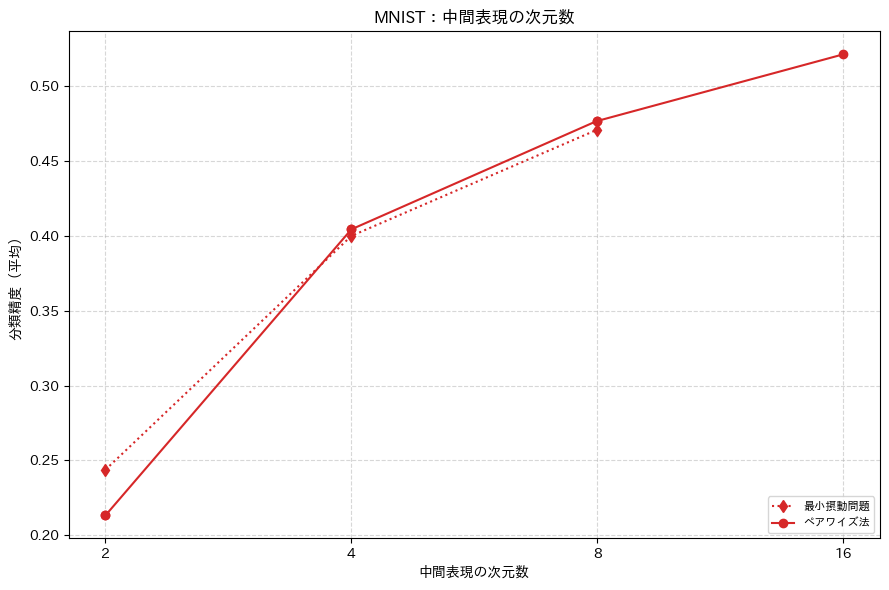

In [217]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_dim_exp",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="dim_intermediate",
    defaults=DEFAULTS,
)

In [66]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept/result_grid_fashion_mnist_anchor_concordance.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)


TypeError: load_filter_and_plot() missing 2 required keyword-only arguments: 'csv_name' and 'dataset'

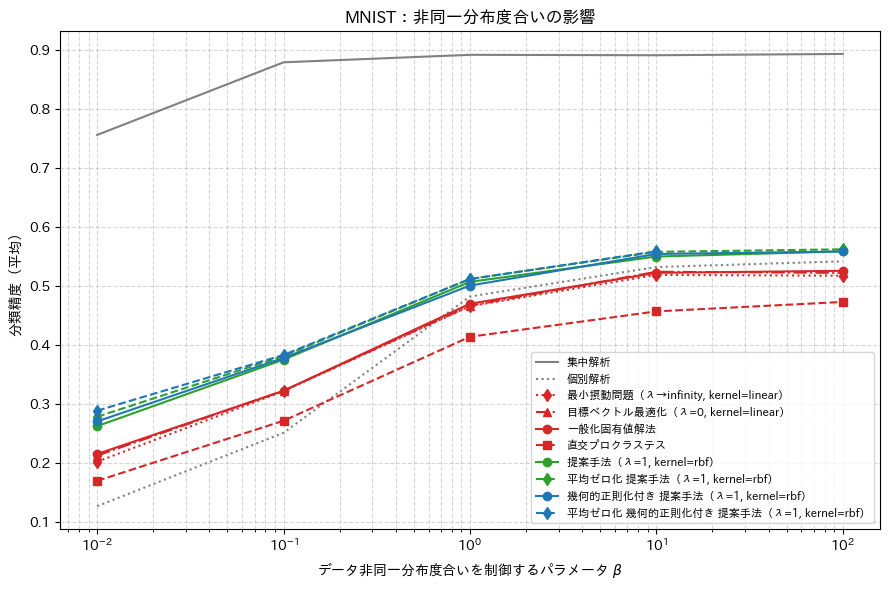

ParserError: Error tokenizing data. C error: Expected 36 fields in line 92, saw 38


In [95]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0101",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0101",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0101",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0101",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

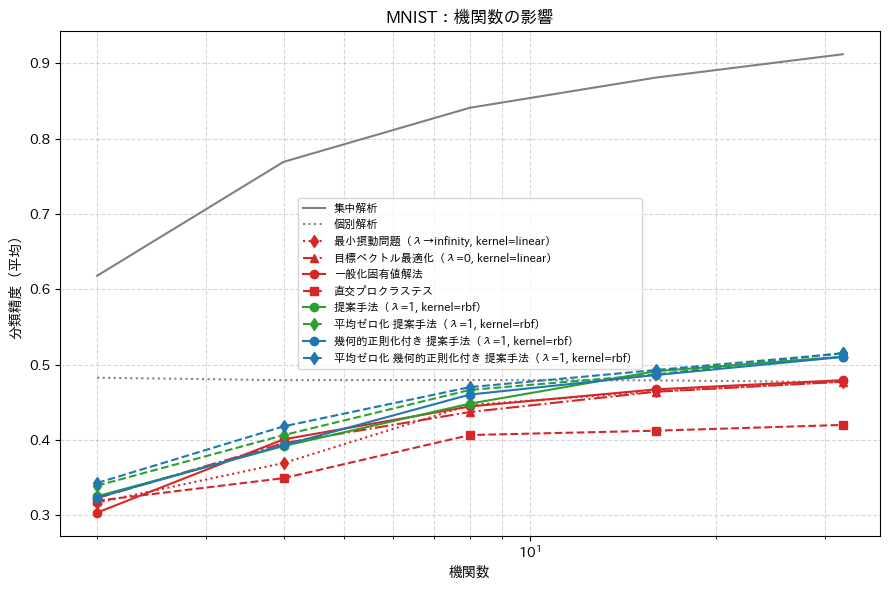

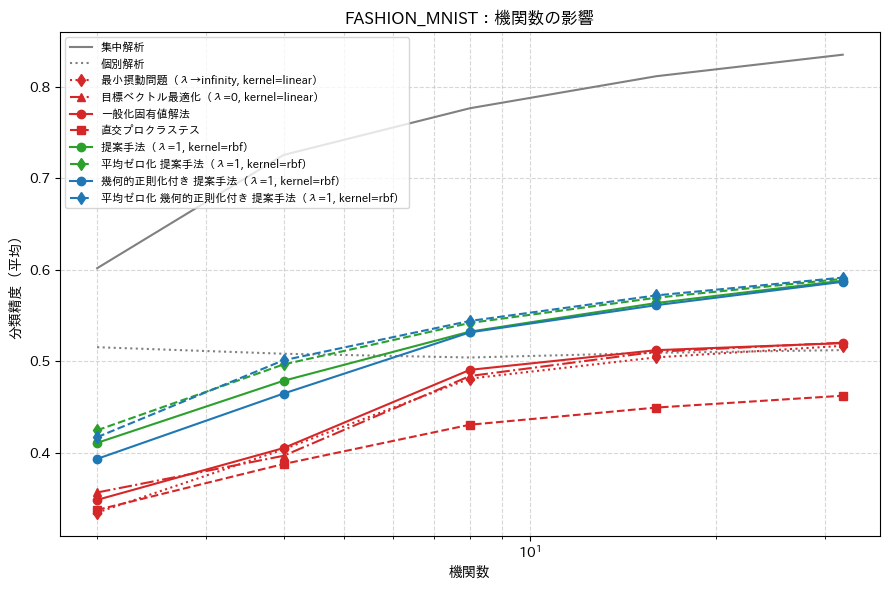

In [113]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_num_inst.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist_num_inst.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

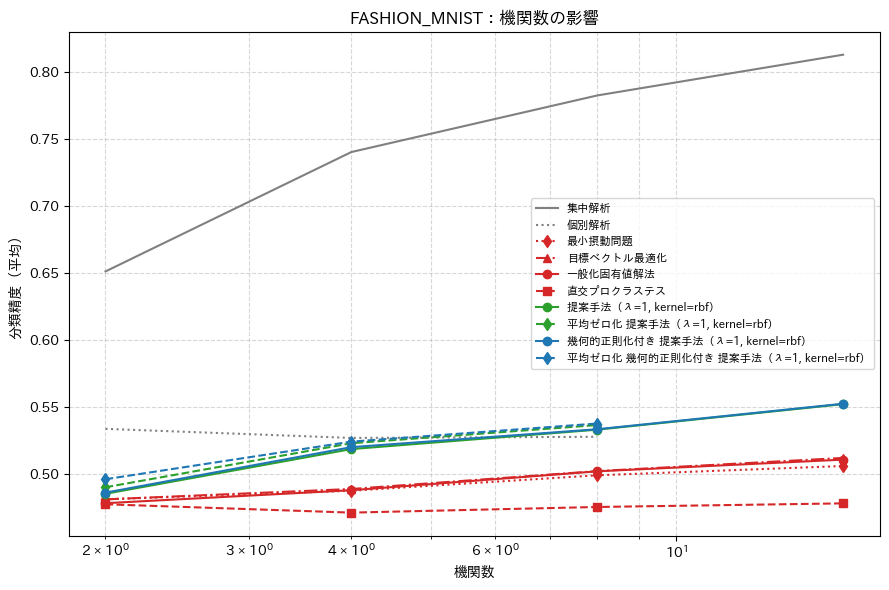

ValueError: No data left after DEFAULTS filtering.

In [443]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

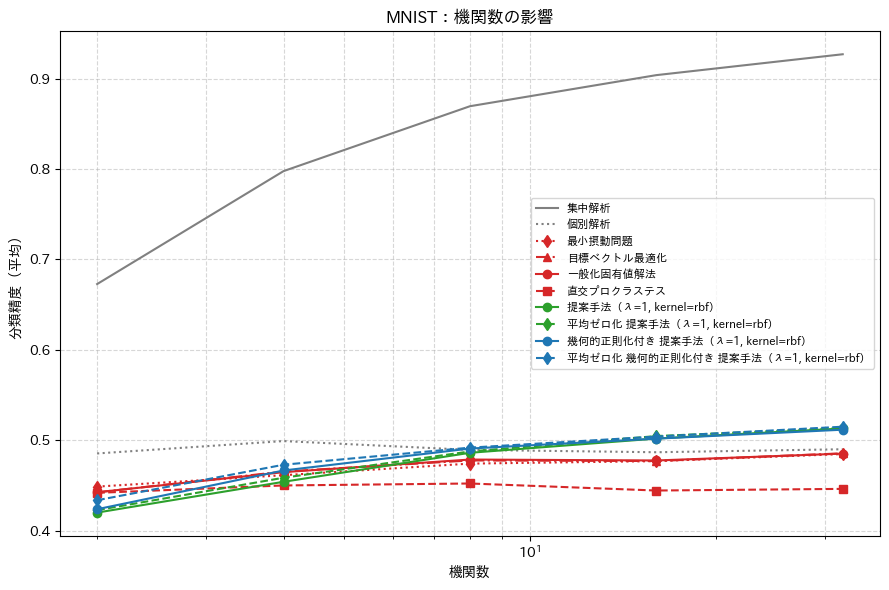

ValueError: No data left after DEFAULTS filtering.

In [444]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

In [406]:


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="num_institution",
    defaults=DEFAULTS,
)


load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/suetake/git-repos/takano_labo/dca/output/0106_num_inst_rf_100/result_grid_fashion_mnist.csv'

In [121]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/0101",
    dataset="MNIST",
    csv_name="result_grid_mnist_rp.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

KeyError: ['sub_dr_ratio']

<Figure size 900x600 with 0 Axes>

In [ ]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/mnist_experiment_0105",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/mnist_experiment_0105",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

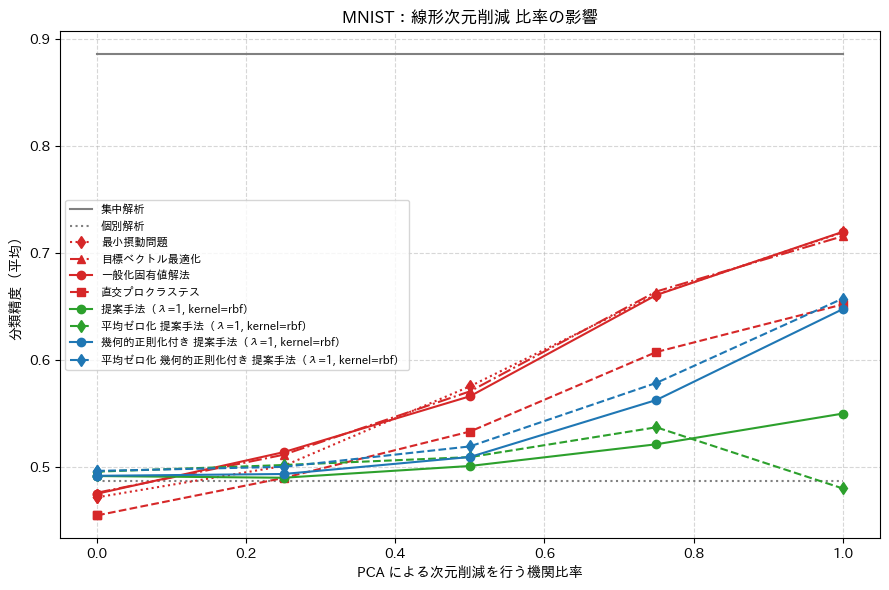

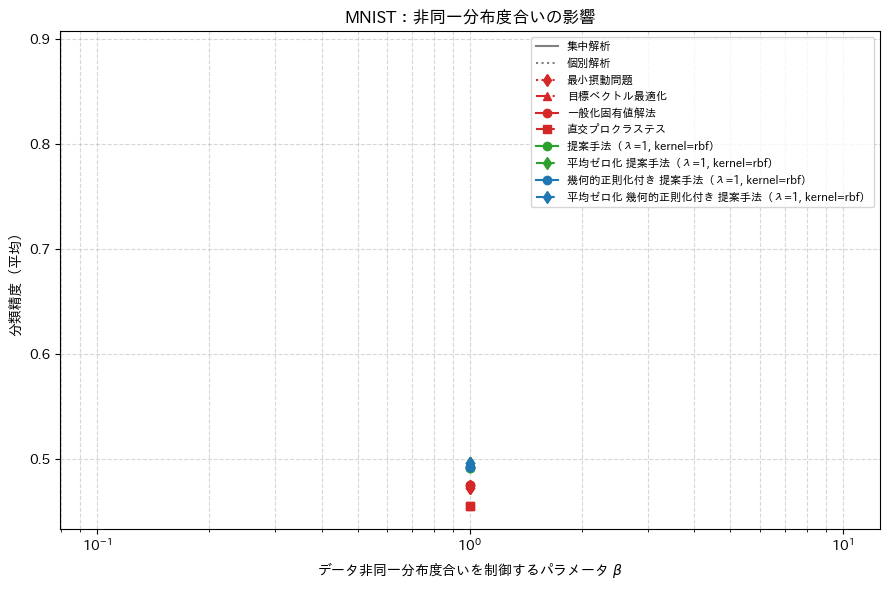

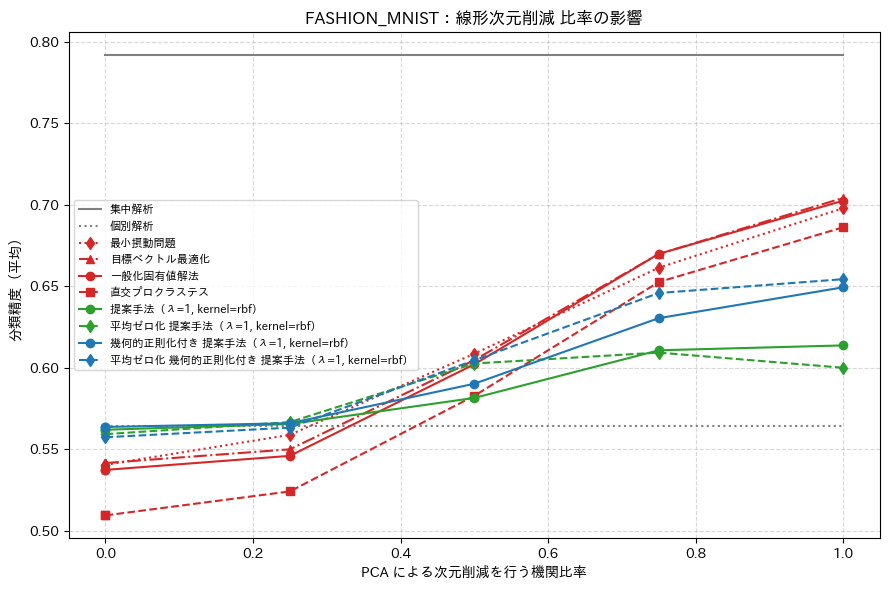

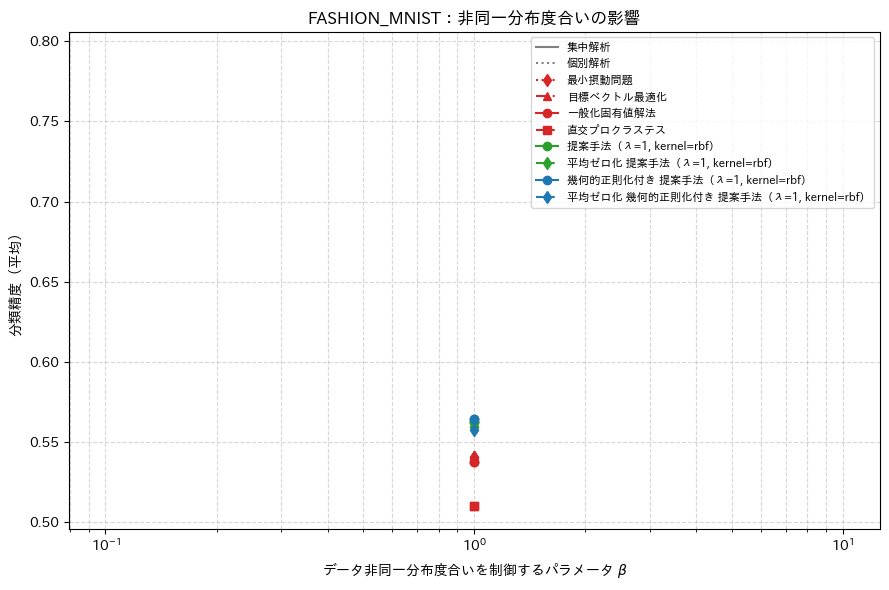

In [240]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/mnist_sub_dr_noniid_0105_K10",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/mnist_sub_dr_noniid_0105_K10",
    dataset="MNIST",
    csv_name="result_grid_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/mnist_sub_dr_noniid_0105_K10",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/mnist_sub_dr_noniid_0105_K10",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

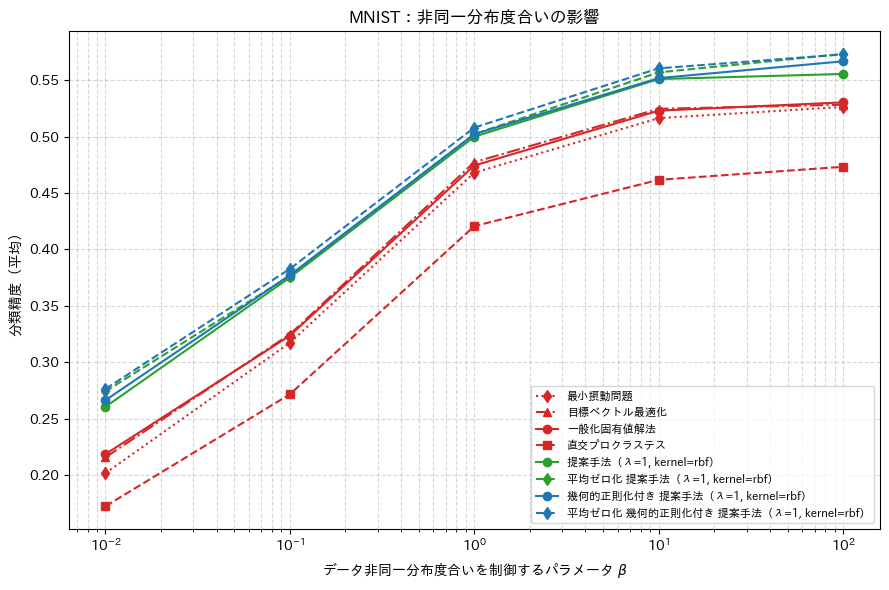

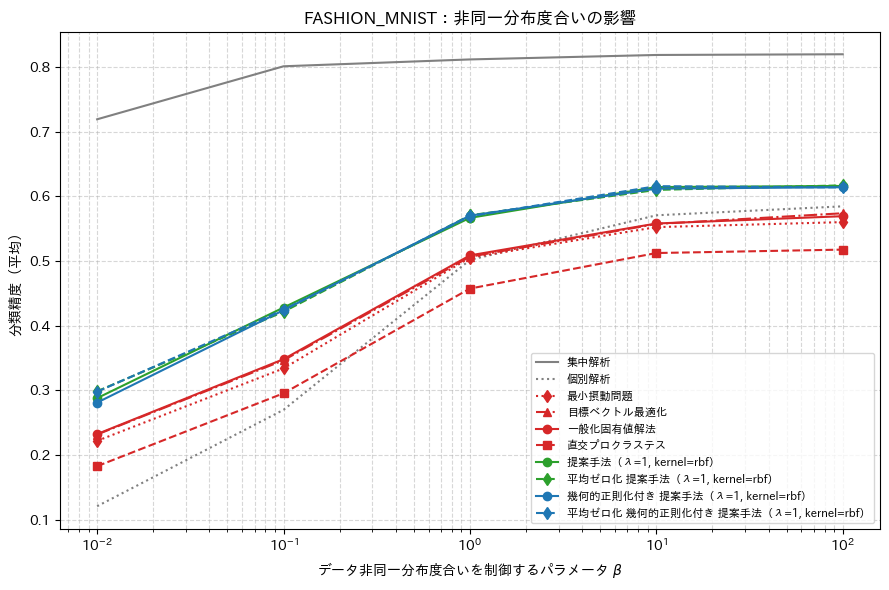

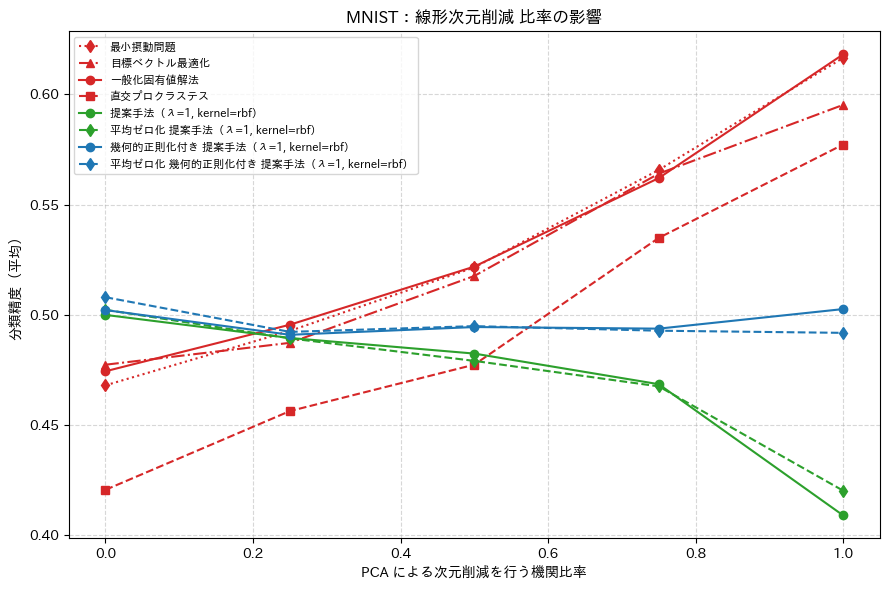

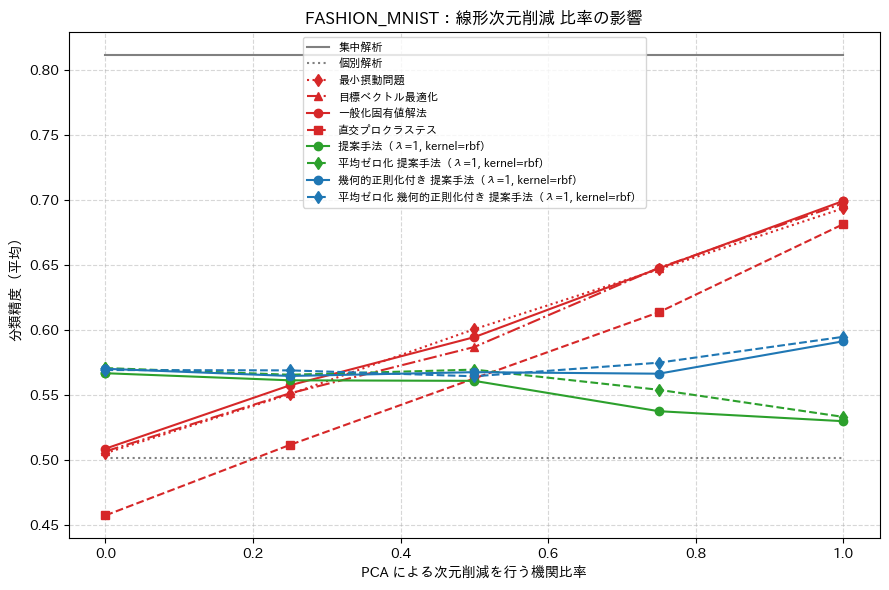

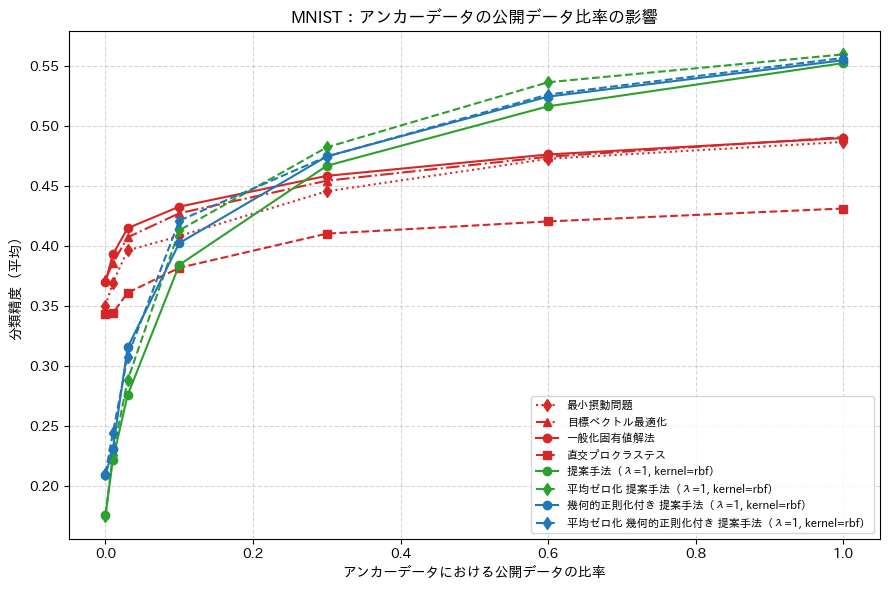

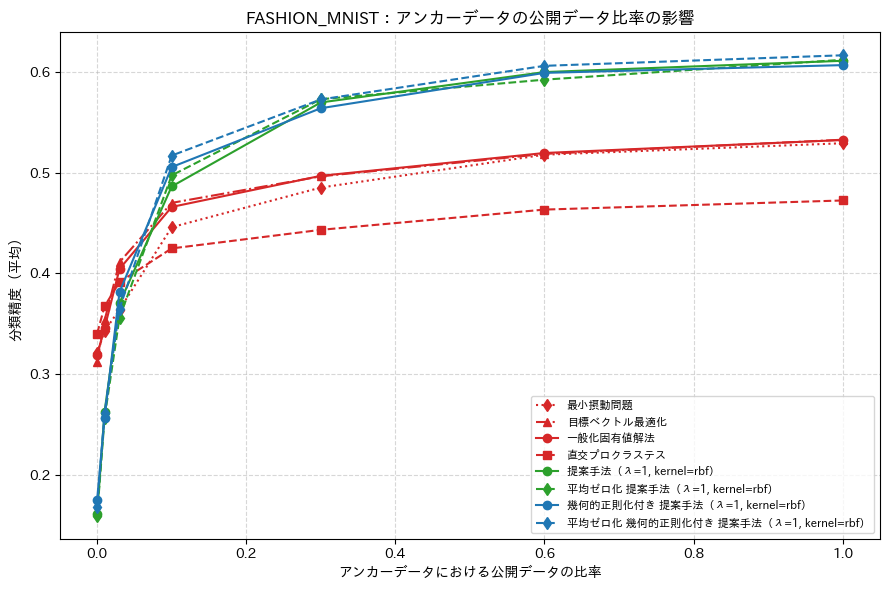

In [118]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_dir_svd.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist_dir_svd.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_dir_svd.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist_dir_svd.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="MNIST",
    csv_name="result_grid_mnist_anchor_concordance.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="FASHION_MNIST",
    csv_name="result_grid_fashion_mnist_anchor_concordance.csv",
    x_col="smote_ratio",
    defaults=DEFAULTS,
)

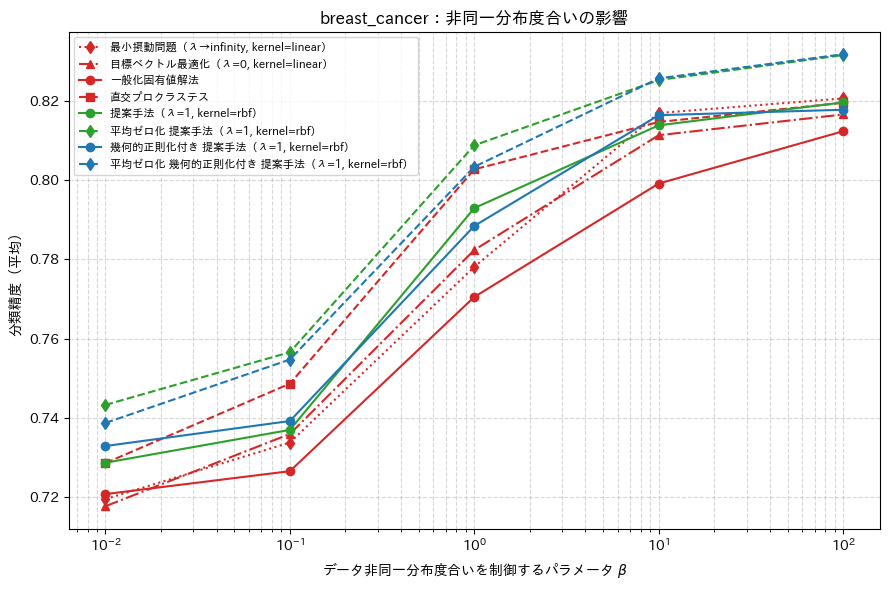

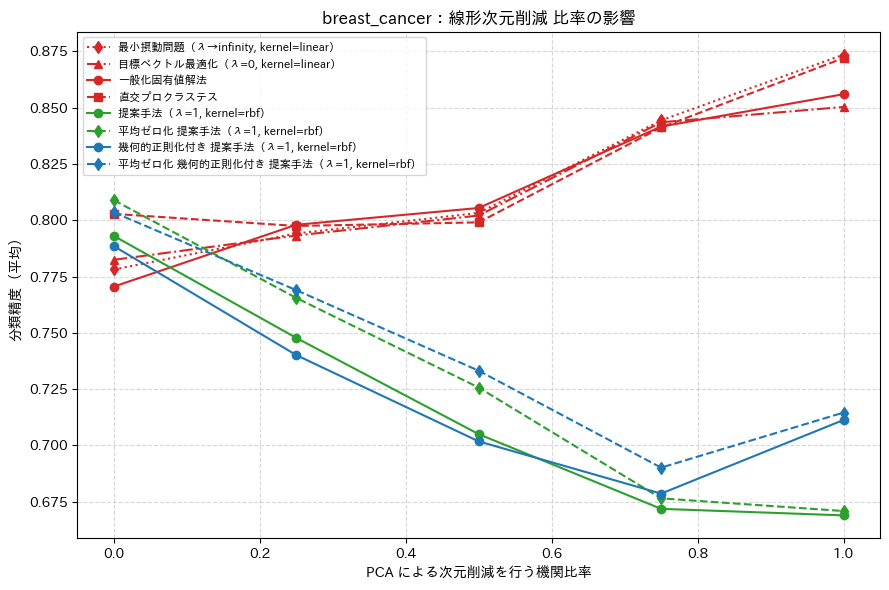

In [56]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="breast_cancer",
    csv_name="result_grid_breast_cancer_dir_svd.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/accept",
    dataset="breast_cancer",
    csv_name="result_grid_breast_cancer_dir_svd.csv",
    x_col="svd_ratio",
    defaults=DEFAULTS,
)

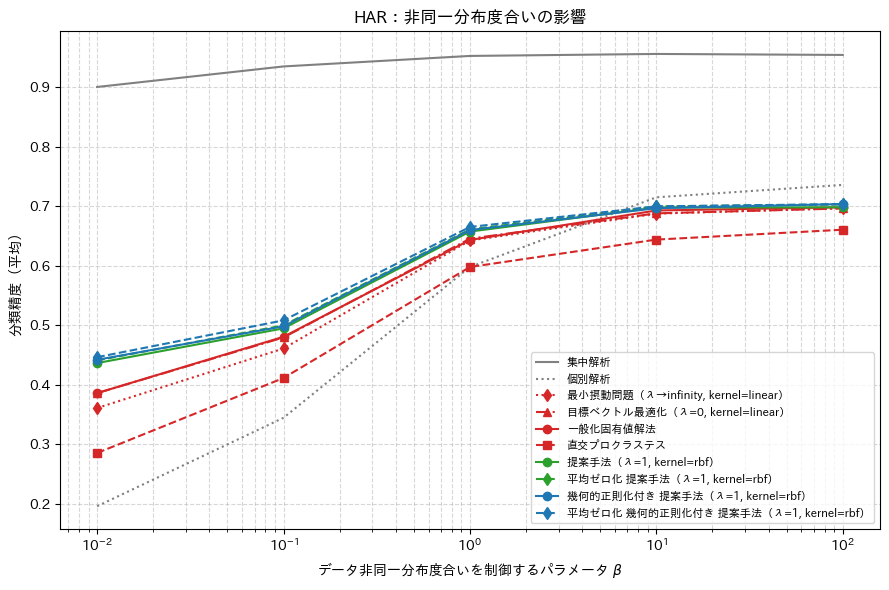

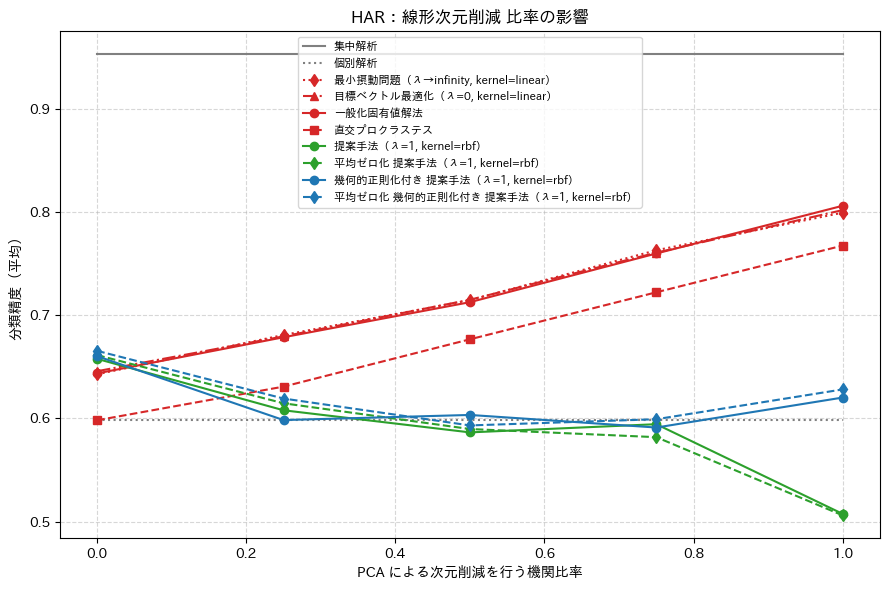

In [109]:
load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/har_svd_nonid_0105",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="non_iid_beta",
    defaults=DEFAULTS,
)

load_filter_and_plot(
    path=r"/Users/suetake/git-repos/takano_labo/dca/output/har_svd_nonid_0105",
    dataset="HAR",
    csv_name="result_grid_har.csv",
    x_col="sub_dr_ratio",
    defaults=DEFAULTS,
)